In [2]:
import matplotlib.pyplot as plt
import syntheticprophet as sp
import pandas as pdtttt
from neuralprophet import NeuralProphet
from fbprophet import Prophet
from collections import OrderedDict
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
from random import random
import pandas as pd
import numpy as np
from time import time
from datetime import datetime
# from benchmark_prophet.pipelines.utils import

from sklearn.metrics import mean_squared_error, mean_absolute_error
from sktime.performance_metrics.forecasting import median_absolute_percentage_error, mean_absolute_scaled_error, MeanSquaredScaledError
from sklearn.preprocessing import MinMaxScaler

def smape(y_true, y_pred):
    return 1/len(y_true) * np.sum(2 * np.abs(y_pred-y_true) / (np.abs(y_true) + np.abs(y_pred))*100)


def wape(y_true, y_pred):
    return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

In [3]:
def _split_df(df, n_lags, n_forecasts, valid_p=0.2, inputs_overbleed=True):
    """Splits timeseries df into train and validation sets.
    Prevents overbleed of targets. Overbleed of inputs can be configured.
    Args:
        df (pd.DataFrame): data
        n_lags (int): identical to NeuralProhet
        n_forecasts (int): identical to NeuralProhet
        valid_p (float, int): fraction (0,1) of data to use for holdout validation set,
            or number of validation samples >1
        inputs_overbleed (bool): Whether to allow last training targets to be first validation inputs (never targets)
    Returns:
        df_train (pd.DataFrame):  training data
        df_val (pd.DataFrame): validation data
    """
    n_samples = len(df) - n_lags + 2 - (2 * n_forecasts)
    n_samples = n_samples if inputs_overbleed else n_samples - n_lags
    if 0.0 < valid_p < 1.0:
        n_valid = max(1, int(n_samples * valid_p))
    else:
        assert valid_p >= 1
        assert type(valid_p) == int
        n_valid = valid_p
    n_train = n_samples - n_valid
    assert n_train >= 1

    split_idx_train = n_train + n_lags + n_forecasts - 1
    split_idx_val = split_idx_train - n_lags if inputs_overbleed else split_idx_train
    df_train = df.copy(deep=True).iloc[:split_idx_train].reset_index(drop=True)
    df_val = df.copy(deep=True).iloc[split_idx_val:].reset_index(drop=True)
    return df_train, df_val

In [4]:
def calculate_metrics(predictions, tr, prophet_training, prophet_predicting, 
                                np_training, np_predicting, n_forecasts, configuration_name):
    
    res_prophet = pd.DataFrame(
        columns=['metrics_name', 'value_prophet']).set_index('metrics_name')
    res_neuralprophet = pd.DataFrame(
        columns=['metrics_name', 'value_neuralprophet']).set_index('metrics_name')
    
    res_prophet.loc['training_time', 'value_prophet'] = prophet_training
    res_prophet.loc['predicting_time', 'value_prophet'] = prophet_predicting
    
    res_neuralprophet.loc['training_time', 'value_neuralprophet'] = np_training
    res_neuralprophet.loc['predicting_time', 'value_neuralprophet'] = np_predicting

    res_prophet.loc['mean_squared_error', 'value_prophet'] = mean_squared_error(y_true=predictions.y,
                                                                                y_pred=predictions.pred_prophet)
    
    res_neuralprophet.loc['mean_squared_error', 'value_neuralprophet'] = np.mean(
        [mean_squared_error(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np']) for i in range(n_forecasts)]
    )

    res_prophet.loc['mean_absolute_error', 'value_prophet'] = mean_absolute_error(
        y_true=predictions.y, y_pred=predictions.pred_prophet)
    res_neuralprophet.loc['mean_absolute_error', 'value_neuralprophet'] = np.mean(
        [mean_absolute_error(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np']) for i in range(n_forecasts)]
    )

    res_prophet.loc['median_absolute_percentage_error', 'value_prophet'] = median_absolute_percentage_error(
        y_true=predictions.y, y_pred=predictions.pred_prophet)
    res_neuralprophet.loc['median_absolute_percentage_error', 'value_neuralprophet'] = np.mean(
        [median_absolute_percentage_error(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np']) for i in range(n_forecasts)]
    )

    res_prophet.loc['mean_absolute_scaled_error', 'value_prophet'] = mean_absolute_scaled_error(
        y_true=predictions.y, y_pred=predictions.pred_prophet, y_train=tr.y)
    res_neuralprophet.loc['mean_absolute_scaled_error', 'value_neuralprophet'] = np.mean(
        [mean_absolute_scaled_error(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np'], y_train=tr.y) for i in range(n_forecasts)]
    )
    
    msse = MeanSquaredScaledError()
    res_prophet.loc['MeanSquaredScaledError', 'value_prophet'] = msse(
        y_true=predictions.y, y_pred=predictions.pred_prophet, y_train=tr.y)
    msse = MeanSquaredScaledError()
    res_neuralprophet.loc['MeanSquaredScaledError', 'value_neuralprophet'] = np.mean(
        [msse(y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np'], y_train=tr.y)
         for i in range(n_forecasts)]
    )
    
    res_prophet.loc['smape', 'value_prophet'] = smape(
        y_true=predictions.y, y_pred=predictions.pred_prophet)
    res_neuralprophet.loc['smape', 'value_neuralprophet'] = np.mean(
        [smape(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np']) for i in range(n_forecasts)]
    )
    
    res_prophet.loc['wape', 'value_prophet'] = wape(
        y_true=predictions.y, y_pred=predictions.pred_prophet)
    res_neuralprophet.loc['wape', 'value_neuralprophet'] = np.mean(
        [wape(
            y_true=predictions.y, y_pred=predictions[f'yhat{i+1}_np']) for i in range(n_forecasts)]
    )
    
    results = res_prophet.reset_index().merge(res_neuralprophet.reset_index())
    results['configuration_name'] = configuration_name
    
    results['value_prophet'] = pd.to_numeric(results['value_prophet'])
    results['value_neuralprophet'] = pd.to_numeric(results['value_neuralprophet'])
    return results



def calculate_metrics_elementwise(y_true_np, y_pred_np,
                                  y_true_pr, y_pred_pr, var_name, configuration_name):
    
    res_prophet = pd.DataFrame(
        columns=['metrics_name', 'value_prophet']).set_index('metrics_name')
    res_neuralprophet = pd.DataFrame(
        columns=['metrics_name', 'value_neuralprophet']).set_index('metrics_name')
    
    res_prophet.loc[f'mean_squared_error_{var_name}', 'value_prophet'] = mean_squared_error(y_true=y_true_pr,
                                                                                y_pred=y_pred_pr)
    
    res_neuralprophet.loc[f'mean_squared_error_{var_name}', 'value_neuralprophet'] = mean_squared_error(
            y_true=y_true_np, y_pred=y_pred_np)

    res_prophet.loc[f'mean_absolute_error_{var_name}', 'value_prophet'] = mean_absolute_error(
        y_true=y_true_pr, y_pred=y_pred_pr)
    res_neuralprophet.loc[f'mean_absolute_error_{var_name}', 'value_neuralprophet'] = mean_absolute_error(
        y_true=y_true_np, y_pred=y_pred_np)

    res_prophet.loc[f'median_absolute_percentage_error_{var_name}', 'value_prophet'] = median_absolute_percentage_error(
        y_true=y_true_pr, y_pred=y_pred_pr)
    res_neuralprophet.loc[f'median_absolute_percentage_error_{var_name}', 'value_neuralprophet'] = median_absolute_percentage_error(
        y_true=y_true_np, y_pred=y_pred_np)

    
    res_prophet.loc[f'smape_{var_name}', 'value_prophet'] = smape(
        y_true=y_true_pr, y_pred=y_pred_pr)
    res_neuralprophet.loc[f'smape_{var_name}', 'value_neuralprophet'] = smape(
        y_true=y_true_np, y_pred=y_pred_np)
    
    res_prophet.loc[f'wape_{var_name}', 'value_prophet'] = wape(
        y_true=y_true_pr, y_pred=y_pred_pr)
    res_neuralprophet.loc[f'wape_{var_name}', 'value_neuralprophet'] = wape(
        y_true=y_true_np, y_pred=y_pred_np)
    
    results = res_prophet.reset_index().merge(res_neuralprophet.reset_index())
    results['configuration_name'] = configuration_name
    
    results['value_prophet'] = pd.to_numeric(results['value_prophet'])
    results['value_neuralprophet'] = pd.to_numeric(results['value_neuralprophet'])
    return results

In [27]:
def generate_ts(number_of_periods,
                         freq,
                         valid_p,

                         seasonality_mode,
                         seasonal_component,
                         seasonality,
                         coeff_seasonality,
                         yearly_seasonality,
                         yearly_seasonality_coeff,
                         series_order,


                         noise_std,
                         constant,
                         coeff_trend,

                         regressor,
                         regressor_mode,
                         rw_step,

                         events,
                         events_mode,
                         n_hist_events,
                         n_future_events,
                         event_size,
                         ):
    '''
    --general
    number_of_periods: int, how many periods of custom seasonality to include
    freq: pd.datetime frequency, for example '1D' for daily
    valid_p: float, <1, proportion of holdout data

    --seasonality
    seasonality_mode: 'additive' or 'multiplicative', applies to both custom and yearly
    seasonality: int, periodicity of custom seasonality component
    seasonal_component: bool, whether to include custom seasonality or not
    coeff_seasonality: float, coefficient of strength of custom seasonalityh in final signal
    yearly_seasonality: bool, whether to include yearly seasonality or not
    yearly_seasonality_coeff: float, coefficient of strength of custom seasonalityh in final signal
    series_order: int, how many fourier components to include in time series

    --trend
    noise_std: float, std of standart norml noise
    constant: float, constant of trend
    coeff_trend: float, coefficient of trend slope

    --regressor
    regressor: bool, whether to include regressor or not
    regressor_mode: 'additive' or 'multiplicative', mode of regressor
    rw_step: float, size of random walk step for regressor

    --events
    events: bool, whether to include events or not
    events_mode: 'additive' or 'multiplicative', mode of events
    n_hist_events: int, number of historical events
    n_future_events: int, number of events in holdout
    event_size: float, size of event
    '''

    len_ts = seasonality*number_of_periods
    df = pd.DataFrame([])
    df['ds'] = pd.to_datetime(pd.date_range(
        start='2020-01-01', periods=len_ts, freq=freq))

    t = np.array((pd.Series(
        pd.to_datetime(df.ds.values)) - datetime(1970, 1, 1)).dt.total_seconds().astype(float)) / (3600 * 24.0)

    # annual seasonality
    if yearly_seasonality:

        period = 365
        features = np.column_stack(
            [fun((2.0 * (i + 1) * np.pi * t / period))
             for i in range(series_order) for fun in (np.sin, np.cos)]
        )
        seasonality_annual = np.zeros_like(features[:, 0])
        for i in range(0, series_order*2):
            seasonality_annual += features[:, i]*(1/(i+1))

        df['seasonality_yearly'] = yearly_seasonality_coeff*(MinMaxScaler().fit_transform(seasonality_annual.reshape(-1, 1)) -\
            MinMaxScaler().fit_transform(seasonality_annual.reshape(-1, 1)).mean())
    else:
        df['seasonality_yearly'] = 0

    # custom seasonality
    if seasonal_component:

        period = seasonality
        features = np.column_stack(
            [fun((2.0 * (i + 1) * np.pi * t / period))
             for i in range(series_order) for fun in (np.sin, np.cos)]
        )

        seasonality_custom = np.zeros_like(features[:, 0])
        for i in range(0, series_order*2):
            seasonality_custom += features[:, i]*np.random.random()

        df['seasonality_custom'] = coeff_seasonality*(MinMaxScaler().fit_transform(seasonality_custom.reshape(-1, 1)) -\
            MinMaxScaler().fit_transform(seasonality_custom.reshape(-1, 1)).mean())
    else:
        df['seasonality_custom'] = 0

    # trend
    n_segments = 11
    segment = np.random.randint(1, n_segments)
    size_segment = int((len_ts*(1-valid_p)*0.9)/n_segments)
    change_point = size_segment*segment
    trend_initial = constant + coeff_trend*np.arange(0, len_ts)

    trend = np.append(trend_initial[:change_point],
                      np.linspace(trend_initial[change_point], constant*coeff_trend,
                                  num=len_ts - change_point))

    trend = MinMaxScaler().fit_transform(np.array(trend).reshape(-1, 1))
    trend = trend - trend.mean()

    df['trend'] = trend

    # regressor
    if regressor:
        random_walk = np.array([])
        random_walk = np.append(random_walk, 0.25 if random() < 0.5 else 0.75)
        for i in range(1, len(df)):
            movement = -rw_step if random() < 0.5 else rw_step
            value = random_walk[i-1] + movement
            random_walk = np.append(random_walk, value)

        regressor_values = MinMaxScaler().fit_transform(
            random_walk.reshape(-1, 1)).reshape(1, -1)[0]
        df['regressor'] = regressor_values - regressor_values.mean()
        
    else:
        df['regressor'] = 0

    # events
    if events:
        size_test = int(len_ts*valid_p)
        when_events_hist = np.random.choice(
            np.arange(len_ts - size_test), n_hist_events)
        when_events_future = np.random.choice(np.arange(
            len_ts - size_test, len_ts), n_future_events)

        all_events = np.append(when_events_hist, when_events_future)

        events_history = pd.DataFrame({
            'event': 'event',
            'ds': df.ds.values[when_events_hist],
        })

        events_future = pd.DataFrame({
            'event': 'event',
            'ds': df.ds.values[when_events_future],
        })

        holidays = pd.concat([events_history, events_future]).copy()
        holidays = holidays.rename({'event': 'holiday'}, axis=1)

        df['event_fact'] = 0
        df.loc[all_events, 'event_fact'] = df.loc[all_events,
                                                  'event_fact'] + event_size

    else:
        df['event_fact'] = 0

    if seasonality_mode == 'additive' and events_mode == 'additive' and regressor_mode == 'additive':
        df['y'] = df['seasonality_custom'] +\
                  df['seasonality_yearly'] +\
                  df['trend'] +\
                  df['regressor'] +\
                  df['event_fact']
    elif seasonality_mode == 'additive' and events_mode == 'additive' and regressor_mode == 'multiplicative':
        df['y'] = df['seasonality_custom'] +\
                  df['seasonality_yearly'] +\
                  df['trend'] +\
                  df['regressor']*df['trend'] +\
                  df['event_fact']
    elif seasonality_mode == 'additive' and events_mode == 'multiplicative' and regressor_mode == 'multiplicative':
        df['y'] = df['seasonality_custom'] +\
                  df['seasonality_yearly'] +\
                  df['trend'] +\
                  df['regressor']*df['trend'] +\
                  df['event_fact']*df['trend']
    elif seasonality_mode == 'additive' and events_mode == 'multiplicative' and regressor_mode == 'additive':
        df['y'] = df['seasonality_custom'] +\
                  df['seasonality_yearly'] +\
                  df['trend'] +\
                  df['regressor'] +\
                  df['event_fact']*df['trend']
    elif seasonality_mode == 'multiplicative' and events_mode == 'multiplicative' and regressor_mode == 'multiplicative':
        df['y'] = df['seasonality_custom']*df['trend'] +\
                  df['seasonality_yearly']*df['trend'] +\
                  df['trend'] +\
                  df['regressor']*df['trend'] +\
                  df['event_fact']*df['trend']
    elif seasonality_mode == 'multiplicative' and events_mode == 'additive' and regressor_mode == 'multiplicative':
        df['y'] = df['seasonality_custom']*df['trend'] +\
                  df['seasonality_yearly']*df['trend'] +\
                  df['trend'] +\
                  df['regressor']*df['trend'] +\
                  df['event_fact']
    elif seasonality_mode == 'multiplicative' and events_mode == 'additive' and regressor_mode == 'additive':
        df['y'] = df['seasonality_custom']*df['trend'] +\
                  df['seasonality_yearly']*df['trend'] +\
                  df['trend'] +\
                  df['regressor'] +\
                  df['event_fact']
    elif seasonality_mode == 'multiplicative' and events_mode == 'multiplicative' and regressor_mode == 'additive':
        df['y'] = df['seasonality_custom']*df['trend'] +\
                  df['seasonality_yearly']*df['trend'] +\
                  df['trend'] +\
                  df['regressor'] +\
                  df['event_fact']*df['trend']
        
    noise = np.array(np.random.normal(0, noise_std, len_ts))
    df['y'] = df['y']+noise
    
    plt.figure(figsize=(20, 5))
    plt.plot(df['ds'].iloc[:], df['y'].iloc[:])
    plt.xlabel('Date')
    plt.ylabel('Value')
    plt.show()

    if events:
        return df, (holidays, events_history, events_future)
    else:
        return df, (None, None, None)

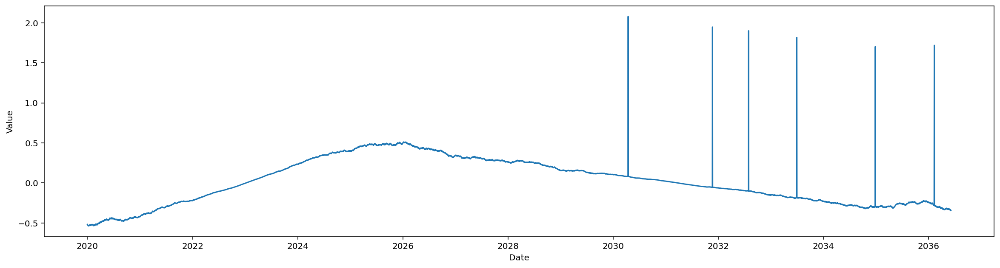

In [28]:
df, events_triplet = generate_ts(number_of_periods=200,
                                 freq='1D',
                                 valid_p=0.1,

                                 seasonality_mode='multiplicative',
                                 seasonal_component=False,
                                 seasonality=30,
                                 coeff_seasonality=0.5,
                                 yearly_seasonality=False,
                                 yearly_seasonality_coeff=0.4,
                                 series_order=5,

                                 noise_std=0,
                                 constant=0,
                                 coeff_trend=1,

                                 regressor=True,
                                 regressor_mode='multiplicative',
                                 rw_step=0.1,

                                 events=True,
                                 events_mode='additive',
                                 n_hist_events=4,
                                 n_future_events=2,
                                 event_size=2
                                 )

In [29]:
def run_models_experiments_s1_2(df,
                                freq,
                                valid_p,

                                seasonality_mode,
                                seasonal_component,
                                seasonality,
                                yearly_seasonality,
                                series_order,

                                regressor,
                                regressor_mode,

                                events,
                                events_mode,
                                events_triplet,


                                n_lags=0,
                                n_forecasts=1,
                                configuration_name='',
                                fold=0):

    len_ts = len(df)
    size_test = int(len_ts*valid_p)

    tr, test = _split_df(df=df,
                         n_lags=n_lags,
                         n_forecasts=n_forecasts,
                         valid_p=size_test)

    test_full = test.copy(deep=True)

    if regressor:
        test = test[['ds', 'y', 'regressor']].copy(deep=True)
        tr = tr[['ds', 'y', 'regressor']].copy(deep=True)
    else:
        test = test[['ds', 'y']].copy(deep=True)
        tr = tr[['ds', 'y']].copy(deep=True)

    if n_lags != 0:
        test_values = test.iloc[-valid_p:].copy()
    else:
        test_values = test.copy()

    if events:
        holidays, events_history, events_future = events_triplet

    # NeuralProphet

    if yearly_seasonality:
        m = NeuralProphet(daily_seasonality=False,
                          yearly_seasonality=series_order,
                          weekly_seasonality=False,
                          n_lags=n_lags,
                          n_forecasts=n_forecasts,
                          seasonality_mode=seasonality_mode,
                          train_speed=1
                          )
    else:
        m = NeuralProphet(daily_seasonality=False,
                          yearly_seasonality=False,
                          weekly_seasonality=False,
                          n_lags=n_lags,
                          n_forecasts=n_forecasts,
                          seasonality_mode=seasonality_mode,
                          train_speed=1
                          )

    if seasonal_component:
        m.add_seasonality('custom_seasonality', seasonality, series_order)

    if regressor:
        m = m.add_future_regressor('regressor', mode=regressor_mode)

    if events:
        m = m.add_events(["event"])
        history_df = m.create_df_with_events(tr, events_history)
        t1 = time()
        metrics = m.fit(history_df, freq=freq)
        t2 = time()
        np_training = t2-t1

        test_df = m.create_df_with_events(test, events_future)

        if regressor:
            future_regressors_df = pd.DataFrame(
                data={'regressor': df['regressor'][:-len(test)]})
            future = m.make_future_dataframe(test_df,
                                             regressors_df=future_regressors_df,
                                             events_df=events_future,
                                             n_historic_predictions=True,
                                             periods=0)
        else:
            future = m.make_future_dataframe(test_df,
                                             events_df=events_future,
                                             n_historic_predictions=True,
                                             periods=0)

        t1 = time()
        forecast = m.predict(future)
        t2 = time()
        np_predicting = t2-t1

    else:
        t1 = time()
        metrics = m.fit(tr, freq=freq)
        t2 = time()
        np_training = t2-t1

        if regressor:
            future_regressors_df = pd.DataFrame(
                data={'regressor': df['regressor'][:-len(test)]})
            future = m.make_future_dataframe(test_df,
                                             regressors_df=future_regressors_df,
                                             n_historic_predictions=True,
                                             periods=0)
        else:

            future = m.make_future_dataframe(
                test, n_historic_predictions=True, periods=0)

        t1 = time()
        forecast = m.predict(future)
        t2 = time()
        np_predicting = t2-t1

    res_np = test_values[['ds', 'y']].merge(forecast[['ds'] + [f'yhat{i+1}' for i in range(n_forecasts)]],
                                            how='left')
    res_np = res_np.rename(
        dict((f'yhat{i+1}', f'yhat{i+1}_np') for i in range(n_forecasts)), axis=1)

    # Prophet

    if yearly_seasonality:
        if events:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=series_order,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode,
                        holidays=holidays)
        else:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=series_order,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode)
    else:
        if events:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=False,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode,
                        holidays=holidays)
        else:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=False,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode)

    if seasonal_component:
        m.add_seasonality(name='custom_seasonality',
                          period=seasonality,
                          fourier_order=series_order)

    if regressor:
        m = m.add_regressor('regressor', mode=regressor_mode)

    t1 = time()
    metrics = m.fit(tr)
    t2 = time()
    prophet_training = t2-t1

    future = m.make_future_dataframe(len(df)-len(tr),
                                     freq=freq,
                                     include_history=False)
    if regressor:
        future = future.merge(test[['ds', 'regressor']])
    t1 = time()
    forecast_pr = m.predict(future)
    t2 = time()
    prophet_predicting = t2-t1

    res_prophet = test_values.merge(forecast_pr[['ds', 'yhat']], how='left').rename({'yhat': 'pred_prophet'},
                                                                                    axis=1)
    predictions = res_prophet.merge(res_np)

    plt.figure(figsize=(20, 5))

    plt.plot(predictions.ds, predictions.pred_prophet,
             label='pred_prophet')
    for i in range(n_forecasts):
        plt.plot(predictions.ds, predictions[f'yhat{i+1}_np'],  color='g', label='pred_neuralprophet',
                 linewidth=0.5)
    plt.plot(predictions.ds, predictions.y,
             color='red', linewidth=0.5, label='time_series')
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())
    plt.show()

    results = calculate_metrics(predictions, tr, prophet_training, prophet_predicting,
                                np_training, np_predicting, n_forecasts, configuration_name)

    test_full = test_full.rename(
        {'trend': 'trend_fact', 'seasonality_yearly': 'seasonality_yearly_fact'}, axis=1)

    forecast_pr = forecast_pr.rename({'regressor': 'future_regressor'}, axis=1)

    trend_metrics = calculate_metrics_elementwise(test_full.merge(forecast).trend_fact,
                                                  test_full.merge(forecast)[
        'trend'],
        test_full.merge(
                                                      forecast_pr).trend_fact,
        test_full.merge(forecast_pr)['trend'], 'trend',
        configuration_name)

    plt.figure(figsize=(20, 5))

    plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast).trend_fact,
             label='trend')
    plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast)['trend'],
             label='trend_np')
    plt.plot(test_full.merge(forecast_pr).ds, test_full.merge(forecast_pr)['trend'],
             label='trend_pr')
    plt.legend()
    plt.show()

    results = pd.concat([results, trend_metrics])

    if events:
        event_metrics = calculate_metrics_elementwise(test_full.merge(forecast).event_fact,
                                                      test_full.merge(forecast)[
            'event_event'],
            test_full.merge(
                                                          forecast_pr).event_fact,
            test_full.merge(forecast_pr)['event'], 'event',
            configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(test_full.merge(forecast).ds, test_full.merge(
            forecast).event_fact, label='fact_event')
        plt.plot(test_full.merge(forecast).ds, test_full.merge(
            forecast)['event_event'], label='event_np')
        plt.plot(test_full.merge(forecast_pr).ds, test_full.merge(
            forecast_pr)['event'], label='event_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, event_metrics])

    if seasonal_component:

        seasonality_metrics = calculate_metrics_elementwise(test_full.merge(forecast).seasonality_custom,
                                                            test_full.merge(forecast)[
            'season_custom_seasonality'],
            test_full.merge(
                                                                forecast_pr).seasonality_custom,
            test_full.merge(forecast_pr)[
            'custom_seasonality'], 'seasonality_custom',
            configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast).seasonality_custom,
                 label='custom_seasonality')
        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast)['season_custom_seasonality'],
                 label='custom_seasonality_np')
        plt.plot(test_full.merge(forecast_pr).ds, test_full.merge(forecast_pr)['custom_seasonality'],
                 label='custom_seasonality_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, seasonality_metrics])
    if yearly_seasonality:
        seasonality_metrics_yearly = calculate_metrics_elementwise(test_full.merge(forecast).seasonality_yearly_fact,
                                                                   test_full.merge(forecast)[
            'season_yearly'],
            test_full.merge(
                                                                       forecast_pr).seasonality_yearly_fact,
            test_full.merge(forecast_pr)['yearly'], 'seasonality_yearly',
            configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast).seasonality_yearly_fact,
                 label='seasonality_yearly')
        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast)['season_yearly'],
                 label='seasonality_yearly_np')
        plt.plot(test_full.merge(forecast_pr).ds, test_full.merge(forecast_pr)['yearly'],
                 label='seasonality_yearly_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, seasonality_metrics_yearly])

    if regressor:
        regressor_metrics = calculate_metrics_elementwise(test_full.merge(forecast).regressor,
                                                          test_full.merge(forecast)[
            'future_regressor_regressor'],
            test_full.merge(
                                                              forecast_pr).regressor,
            test_full.merge(forecast_pr)[
            'future_regressor'], 'future_regressor',
            configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast).regressor,
                 label='regressor')
        plt.plot(test_full.merge(forecast).ds, test_full.merge(forecast)['future_regressor_regressor'],
                 label='regressor_np')
        plt.plot(test_full.merge(forecast_pr).ds, test_full.merge(forecast_pr)['future_regressor'],
                 label='regressor_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, regressor_metrics])

    results['fold'] = fold

    return predictions.merge(df), results

In [35]:
def run_models_experiments_full_ts(df,
                                   freq,
                                   valid_p,
                                   seasonality_mode,
                                   seasonal_component,
                                   seasonality,
                                   yearly_seasonality,
                                   series_order,
                                   regressor,
                                   regressor_mode,
                                   events,
                                   events_mode,
                                   events_triplet,
                                   n_lags=0,
                                   n_forecasts=1,
                                   configuration_name='',
                                   fold=0):

    len_ts = len(df)
    

    df_full = df.copy(deep=True)

    if regressor:
        df = df[['ds', 'y', 'regressor']].copy(deep=True)
    else:
        df = df[['ds', 'y']].copy(deep=True)

    if events:
        holidays, events_history, events_future = events_triplet
        
        events_np = pd.concat([events_history, events_future])

    # NeuralProphet

    if yearly_seasonality:
        m = NeuralProphet(daily_seasonality=False,
                          yearly_seasonality=series_order,
                          weekly_seasonality=False,
                          n_lags=n_lags,
                          n_forecasts=n_forecasts,
                          seasonality_mode=seasonality_mode,
                          train_speed=1)
    else:
        m = NeuralProphet(daily_seasonality=False,
                          yearly_seasonality=False,
                          weekly_seasonality=False,
                          n_lags=n_lags,
                          n_forecasts=n_forecasts,
                          seasonality_mode=seasonality_mode,
                          train_speed=1)

    if seasonal_component:
        m.add_seasonality('custom_seasonality', seasonality, series_order)

    if regressor:
        m = m.add_future_regressor('regressor', mode=regressor_mode)

    if events:
        m = m.add_events(["event"])
        history_df = m.create_df_with_events(df, events_np)
        t1 = time()
        metrics = m.fit(history_df, freq=freq)
        t2 = time()
        np_training = t2 - t1

        test_df = m.create_df_with_events(df, events_np)

        if regressor:
            future_regressors_df = pd.DataFrame(
                data={'regressor': df['regressor']})
            future = m.make_future_dataframe(
                test_df,
                regressors_df=future_regressors_df,
                events_df=events_np,
                n_historic_predictions=True,
                periods=0)
        else:
            future = m.make_future_dataframe(test_df,
                                             events_df=events_np,
                                             n_historic_predictions=True,
                                             periods=0)

        t1 = time()
        forecast = m.predict(future)
        t2 = time()
        np_predicting = t2 - t1

    else:
        t1 = time()
        metrics = m.fit(df, freq=freq)
        t2 = time()
        np_training = t2 - t1

        if regressor:
            future_regressors_df = pd.DataFrame(
                data={'regressor': df['regressor']})
            future = m.make_future_dataframe(
                df,
                regressors_df=future_regressors_df,
                n_historic_predictions=True,
                periods=0)
        else:

            future = m.make_future_dataframe(df,
                                             n_historic_predictions=True,
                                             periods=0)

        t1 = time()
        forecast = m.predict(future)
        t2 = time()
        np_predicting = t2 - t1

    res_np = df[['ds', 'y']].merge(
        forecast[['ds'] + [f'yhat{i+1}' for i in range(n_forecasts)]],
        how='left')
    res_np = res_np.rename(dict(
        (f'yhat{i+1}', f'yhat{i+1}_np') for i in range(n_forecasts)),
                           axis=1)

    # Prophet

    if yearly_seasonality:
        if events:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=series_order,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode,
                        holidays=holidays)
        else:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=series_order,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode)
    else:
        if events:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=False,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode,
                        holidays=holidays)
        else:
            m = Prophet(daily_seasonality=False,
                        yearly_seasonality=False,
                        weekly_seasonality=False,
                        seasonality_mode=seasonality_mode)

    if seasonal_component:
        m.add_seasonality(name='custom_seasonality',
                          period=seasonality,
                          fourier_order=series_order)

    if regressor:
        m = m.add_regressor('regressor', mode=regressor_mode)

    t1 = time()
    metrics = m.fit(df)
    t2 = time()
    prophet_training = t2 - t1

    future = m.make_future_dataframe(len(df),
                                     freq=freq,
                                     include_history=True)
    if regressor:
        future = future.merge(df[['ds', 'regressor']])
    t1 = time()
    forecast_pr = m.predict(future)
    t2 = time()
    prophet_predicting = t2 - t1

    res_prophet = df.merge(forecast_pr[['ds',
                                                 'yhat']], how='left').rename(
                                                     {'yhat': 'pred_prophet'},
                                                     axis=1)
    predictions = res_prophet.merge(res_np)

    plt.figure(figsize=(20, 5))

    plt.plot(predictions.ds, predictions.pred_prophet, label='pred_prophet')
    for i in range(n_forecasts):
        plt.plot(predictions.ds,
                 predictions[f'yhat{i+1}_np'],
                 color='g',
                 label='pred_neuralprophet',
                 linewidth=0.5)
    plt.plot(predictions.ds,
             predictions.y,
             color='red',
             linewidth=0.5,
             label='time_series', marker='o', markersize=3)
    handles, labels = plt.gca().get_legend_handles_labels()
    by_label = OrderedDict(zip(labels, handles))
    plt.legend(by_label.values(), by_label.keys())
    plt.show()

    results = calculate_metrics(predictions, df, prophet_training,
                                prophet_predicting, np_training, np_predicting,
                                n_forecasts, configuration_name)

    df_full = df_full.rename(
        {
            'trend': 'trend_fact',
            'seasonality_yearly': 'seasonality_yearly_fact'
        },
        axis=1)

    forecast_pr = forecast_pr.rename({'regressor': 'future_regressor'}, axis=1)

    trend_metrics = calculate_metrics_elementwise(
        df_full.merge(forecast).trend_fact,
        df_full.merge(forecast)['trend'],
        df_full.merge(forecast_pr).trend_fact,
        df_full.merge(forecast_pr)['trend'], 'trend', configuration_name)

    plt.figure(figsize=(20, 5))

    plt.plot(df_full.merge(forecast).ds,
             df_full.merge(forecast).trend_fact,
             label='trend', marker='o', markersize=3)
    plt.plot(df_full.merge(forecast).ds,
             df_full.merge(forecast)['trend'],
             label='trend_np')
    plt.plot(df_full.merge(forecast_pr).ds,
             df_full.merge(forecast_pr)['trend'],
             label='trend_pr')
    plt.legend()
    plt.show()

    results = pd.concat([results, trend_metrics])

    if events:
        event_metrics = calculate_metrics_elementwise(
            df_full.merge(forecast).event_fact,
            df_full.merge(forecast)['event_event'],
            df_full.merge(forecast_pr).event_fact,
            df_full.merge(forecast_pr)['event'], 'event', configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast).event_fact,
                 label='fact_event', marker='o', markersize=3)
        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast)['event_event'],
                 label='event_np')
        plt.plot(df_full.merge(forecast_pr).ds,
                 df_full.merge(forecast_pr)['event'],
                 label='event_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, event_metrics])

    if seasonal_component:

        seasonality_metrics = calculate_metrics_elementwise(
            df_full.merge(forecast).seasonality_custom,
            df_full.merge(forecast)['season_custom_seasonality'],
            df_full.merge(forecast_pr).seasonality_custom,
            df_full.merge(forecast_pr)['custom_seasonality'],
            'seasonality_custom', configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast).seasonality_custom,
                 label='custom_seasonality', marker='o', markersize=3)
        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast)['season_custom_seasonality'],
                 label='custom_seasonality_np')
        plt.plot(df_full.merge(forecast_pr).ds,
                 df_full.merge(forecast_pr)['custom_seasonality'],
                 label='custom_seasonality_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, seasonality_metrics])
    if yearly_seasonality:
        seasonality_metrics_yearly = calculate_metrics_elementwise(
            df_full.merge(forecast).seasonality_yearly_fact,
            df_full.merge(forecast)['season_yearly'],
            df_full.merge(forecast_pr).seasonality_yearly_fact,
            df_full.merge(forecast_pr)['yearly'], 'seasonality_yearly',
            configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast).seasonality_yearly_fact,
                 label='seasonality_yearly', marker='o', markersize=3)
        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast)['season_yearly'],
                 label='seasonality_yearly_np')
        plt.plot(df_full.merge(forecast_pr).ds,
                 df_full.merge(forecast_pr)['yearly'],
                 label='seasonality_yearly_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, seasonality_metrics_yearly])

    if regressor:
        regressor_metrics = calculate_metrics_elementwise(
            df_full.merge(forecast).regressor,
            df_full.merge(forecast)['future_regressor_regressor'],
            df_full.merge(forecast_pr).regressor,
            df_full.merge(forecast_pr)['future_regressor'],
            'future_regressor', configuration_name)

        plt.figure(figsize=(20, 5))

        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast).regressor,
                 label='regressor', marker='o', markersize=3)
        plt.plot(df_full.merge(forecast).ds,
                 df_full.merge(forecast)['future_regressor_regressor'],
                 label='regressor_np')
        plt.plot(df_full.merge(forecast_pr).ds,
                 df_full.merge(forecast_pr)['future_regressor'],
                 label='regressor_pr')
        plt.legend()
        plt.show()

        results = pd.concat([results, regressor_metrics])

    results['fold'] = fold

    return predictions.merge(df), results

In [36]:
def do_experiment(configuration_name,
                  number_of_periods,
                  freq,
                  valid_p,

                  seasonality_mode,
                  seasonal_component,
                  seasonality,
                  coeff_seasonality,
                  yearly_seasonality,
                  yearly_seasonality_coeff,
                  series_order,

                  noise_std,
                  constant,
                  coeff_trend,

                  regressor,
                  regressor_mode,
                  rw_step,

                  events,
                  events_mode,
                  n_hist_events,
                  n_future_events,
                  event_size,
                  n_lags,
                  n_forecasts):

    exp_metrics_df = []
    

    for k in range(5):
        df, events_triplet = generate_ts(number_of_periods=number_of_periods,
                                         freq=freq,
                                         valid_p=valid_p,

                                         seasonality_mode=seasonality_mode,
                                         seasonal_component=seasonal_component,
                                         seasonality=seasonality,
                                         coeff_seasonality=coeff_seasonality,
                                         yearly_seasonality=yearly_seasonality,
                                         yearly_seasonality_coeff=yearly_seasonality_coeff,
                                         series_order=series_order,

                                         noise_std=noise_std,
                                         constant=constant,
                                         coeff_trend=coeff_trend,

                                         regressor=regressor,
                                         regressor_mode=regressor_mode,
                                         rw_step=rw_step,

                                         events=events,
                                         events_mode=events_mode,
                                         n_hist_events=n_hist_events,
                                         n_future_events=n_future_events,
                                         event_size=event_size
                                         )

        df.to_csv(f'signals/{configuration_name}_fold_{k}.csv')

        plt.figure(figsize=(20, 5))
        plt.plot(df['ds'].iloc[:], df['y'].iloc[:])
        plt.xlabel('Date')
        plt.ylabel('Value')
        plt.savefig(f'plots/{configuration_name}_fold_{k}.png')
        plt.close()
        
        
        predictions, results = run_models_experiments_full_ts(df=df,
                                                           freq=freq,
                                                           valid_p=valid_p,

                                                           seasonality_mode=seasonality_mode,
                                                           seasonal_component=seasonal_component,
                                                           seasonality=seasonality,
                                                           yearly_seasonality=yearly_seasonality,
                                                           series_order=series_order,

                                                           regressor=regressor,
                                                           regressor_mode=regressor_mode,

                                                           events=events,
                                                           events_mode=events_mode,
                                                           events_triplet=events_triplet,


                                                           n_lags=n_lags,
                                                           n_forecasts=n_forecasts,
                                                           configuration_name=configuration_name,
                                                           fold=k)
        predictions.to_csv(f'predictions/fold_{k}_{configuration_name}.csv')
        exp_metrics_df.append(results)

    res = pd.concat(exp_metrics_df)
    res['value_prophet'] = pd.to_numeric(res['value_prophet'])
    res['value_neuralprophet'] = pd.to_numeric(res['value_neuralprophet'])
    res.to_csv(f'results/{configuration_name}.csv', index=False)

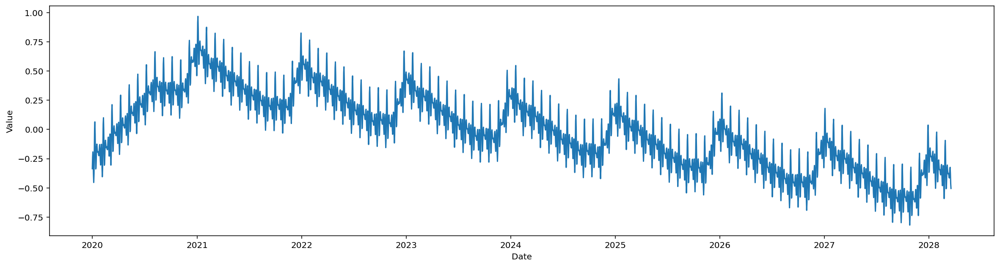

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.66E-01, min: 2.58E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.66E-01, min: 2.58E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 1.03E+00
INFO:NP.utils_torch:learning rate range test selected lr: 1.03E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 2.0688827474684723
INFO:NP.config:train_speed-1 increased learning_rate to 2.0688827474684723
Epoch[68/68]: 100%|██████████| 68/68 [00:04<00:00, 14.85it/s, SmoothL1Loss=0.000106, MAE=0.0101, MSE=0.000388, RegLoss=0]


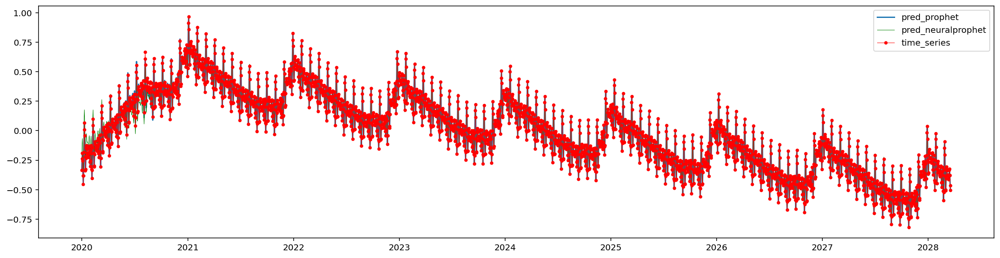

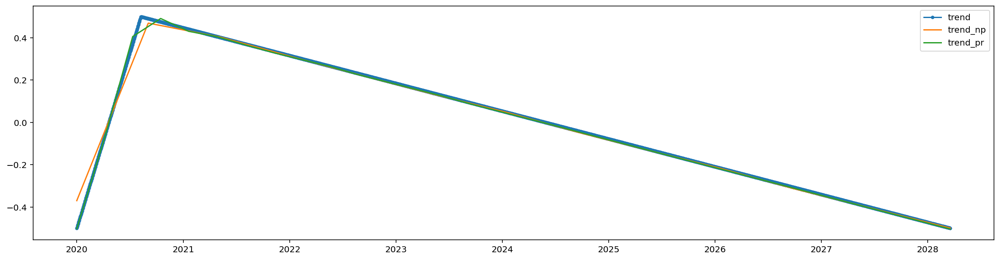

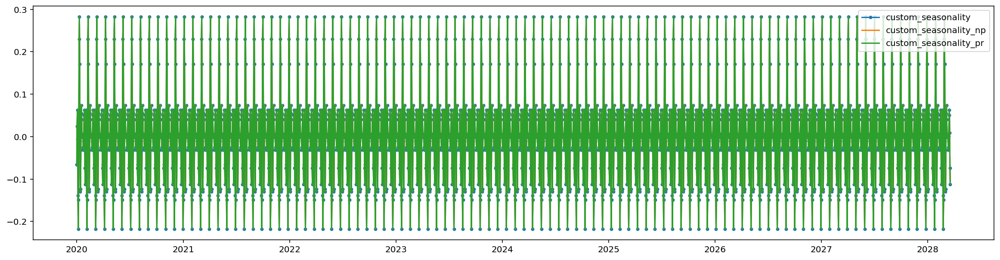

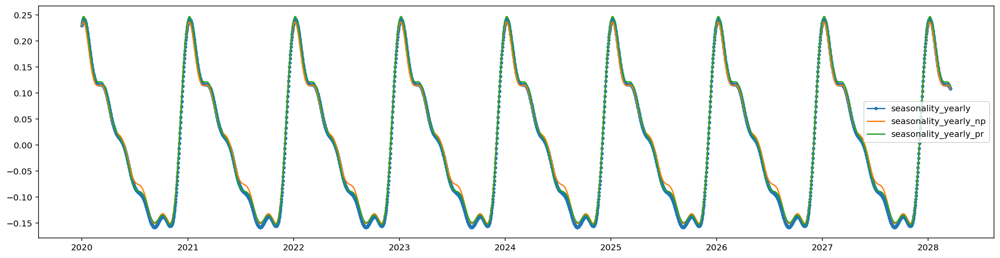

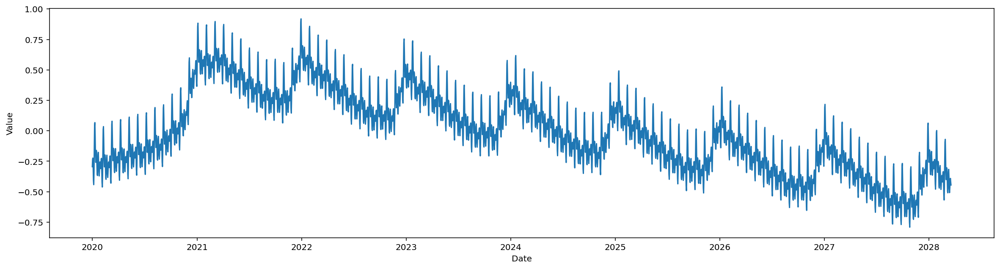

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.30E-02, min: 1.40E+00
INFO:NP.utils_torch:lr-range-test results: steep: 5.30E-02, min: 1.40E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 4.71E-01
INFO:NP.utils_torch:learning rate range test selected lr: 4.71E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.9415082140575166
INFO:NP.config:train_speed-1 increased learning_rate to 0.9415082140575166
Epoch[68/68]: 100%|██████████| 68/68 [00:04<00:00, 14.76it/s, SmoothL1Loss=4.06e-5, MAE=0.00743, MSE=0.000146, RegLoss=0]


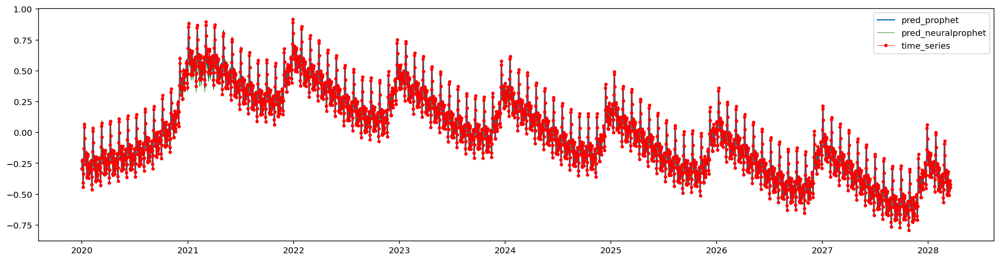

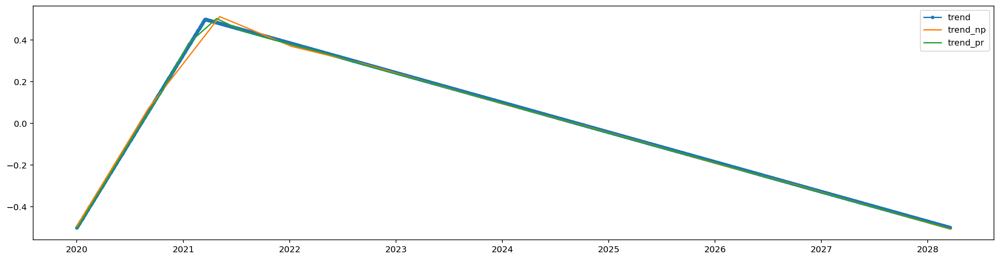

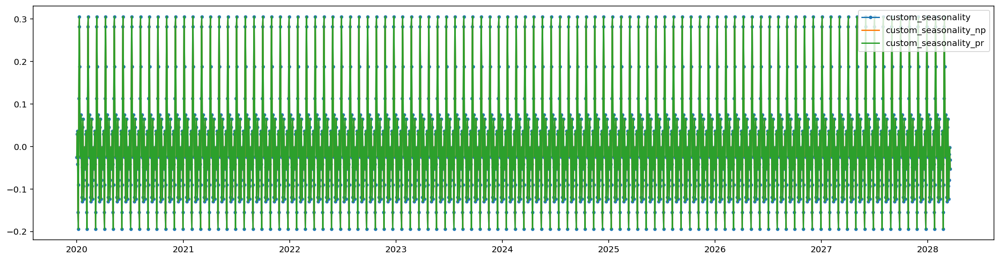

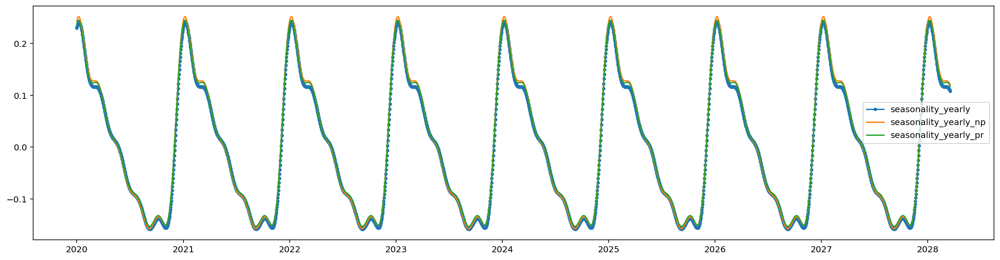

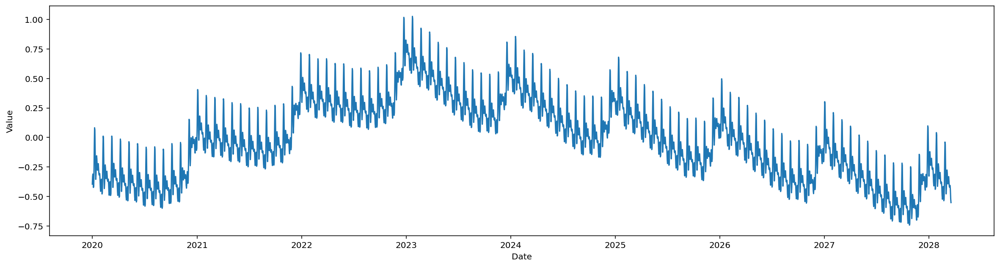

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.76E+00
INFO:NP.utils_torch:lr-range-test results: steep: 4.22E-02, min: 1.76E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 5.08E-01
INFO:NP.utils_torch:learning rate range test selected lr: 5.08E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.0160436093826046
INFO:NP.config:train_speed-1 increased learning_rate to 1.0160436093826046
Epoch[68/68]: 100%|██████████| 68/68 [00:04<00:00, 14.93it/s, SmoothL1Loss=2.7e-5, MAE=0.00621, MSE=9.15e-5, RegLoss=0]  


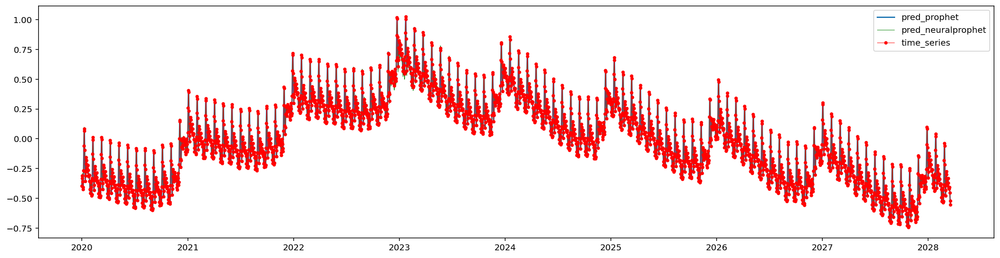

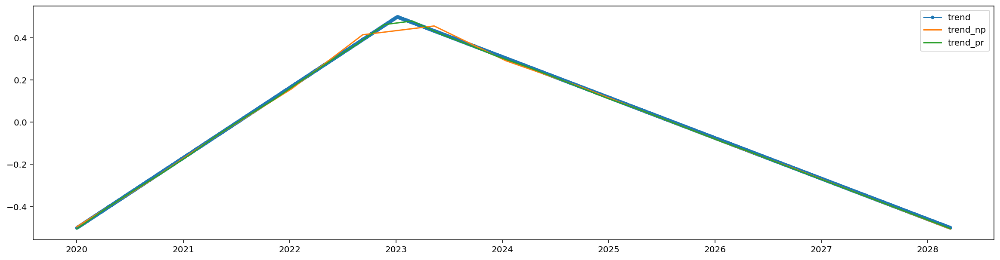

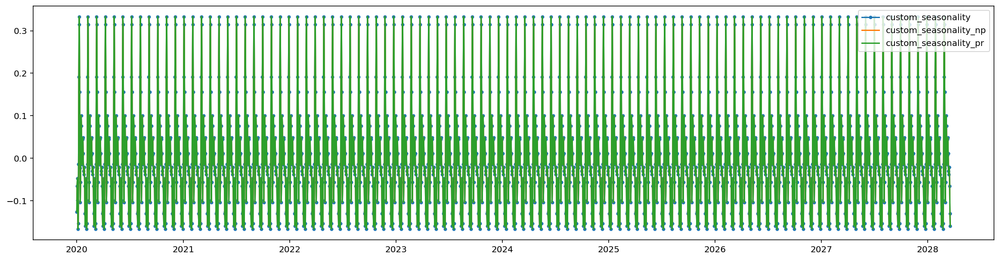

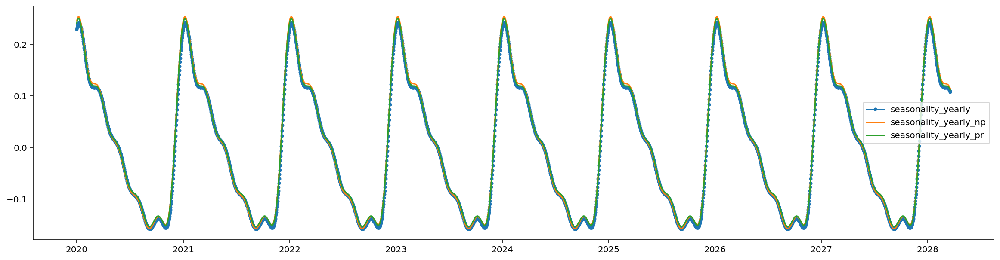

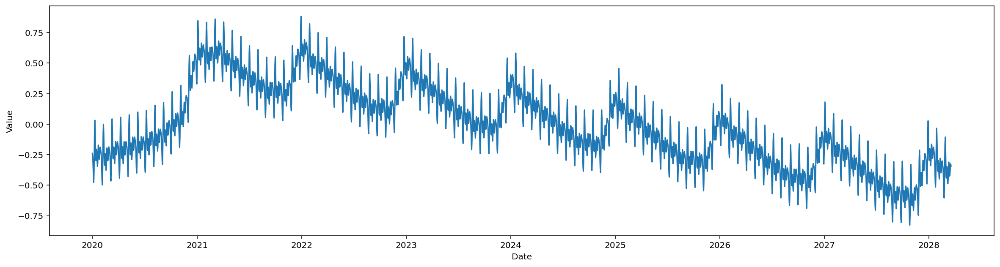

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.91E-02, min: 1.51E+00
INFO:NP.utils_torch:lr-range-test results: steep: 4.91E-02, min: 1.51E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 4.83E-01
INFO:NP.utils_torch:learning rate range test selected lr: 4.83E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.9657251130047373
INFO:NP.config:train_speed-1 increased learning_rate to 0.9657251130047373
Epoch[68/68]: 100%|██████████| 68/68 [00:04<00:00, 14.99it/s, SmoothL1Loss=3.85e-5, MAE=0.0076, MSE=0.000147, RegLoss=0] 


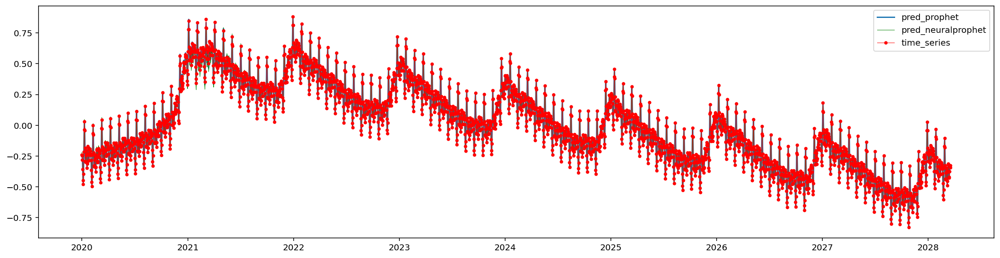

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



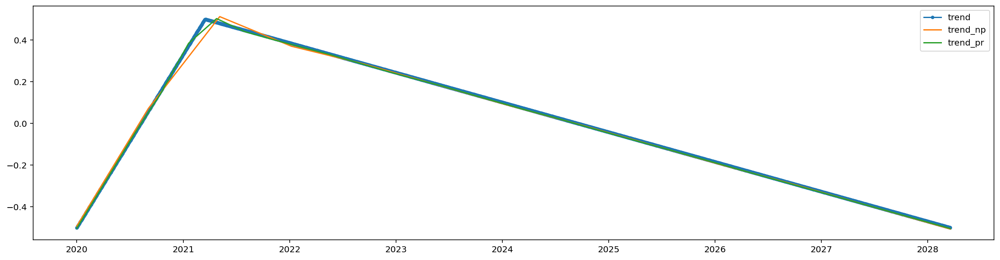

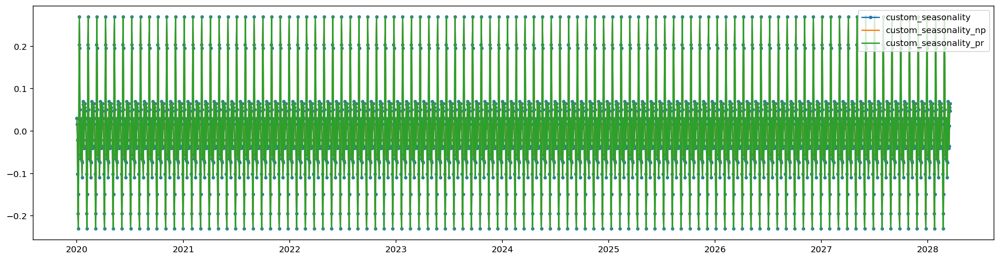

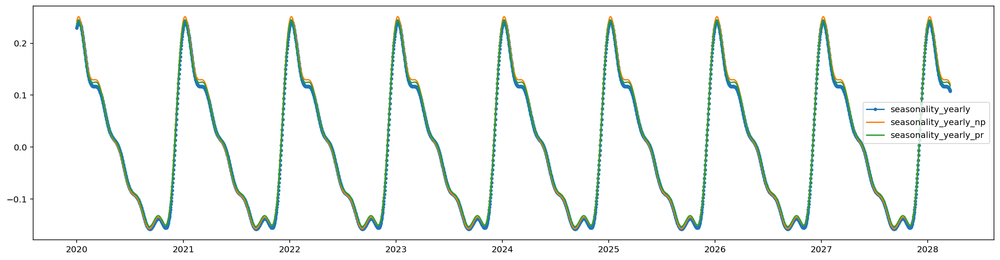

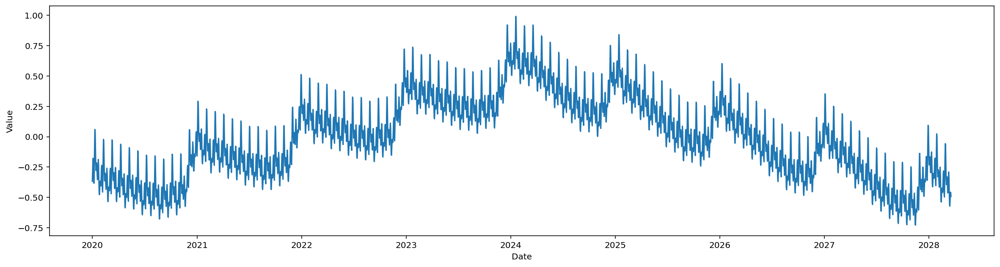

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.22E-02, min: 1.76E+00
INFO:NP.utils_torch:lr-range-test results: steep: 4.22E-02, min: 1.76E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 5.08E-01
INFO:NP.utils_torch:learning rate range test selected lr: 5.08E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.0160436093826046
INFO:NP.config:train_speed-1 increased learning_rate to 1.0160436093826046
Epoch[68/68]: 100%|██████████| 68/68 [00:04<00:00, 15.15it/s, SmoothL1Loss=1.64e-5, MAE=0.00489, MSE=5.37e-5, RegLoss=0] 


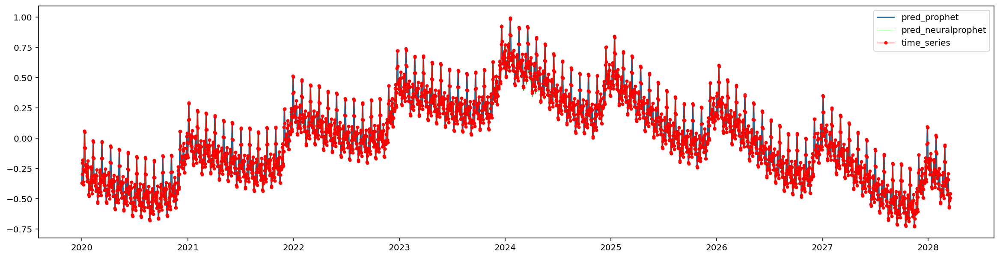

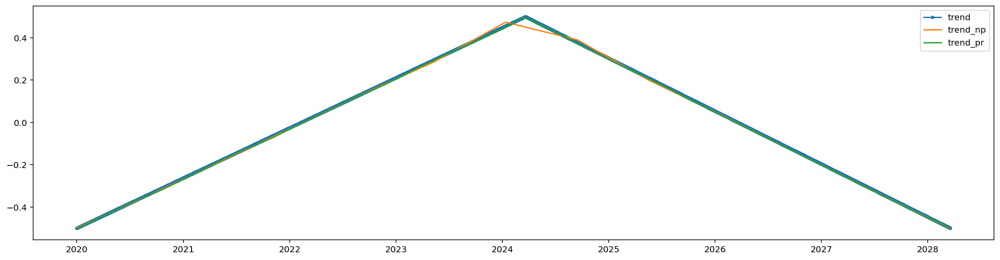

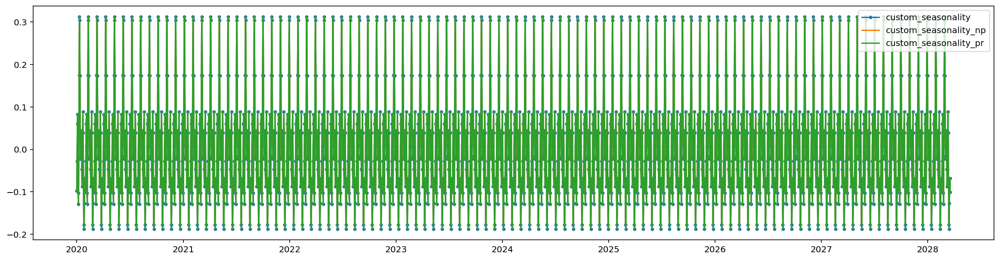

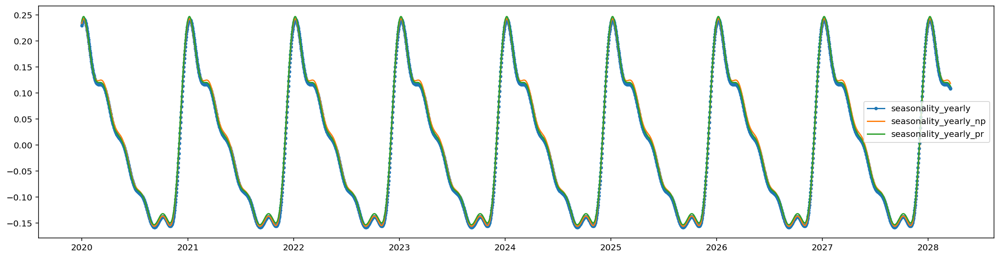

In [37]:
exp_metrics_df = []


configuration_name = 'S1.1'


number_of_periods = 100
freq = '1D'
valid_p = 0.1

seasonality_mode = 'additive'
seasonal_component = True
seasonality = 30
coeff_seasonality = 0.5
yearly_seasonality = True
yearly_seasonality_coeff = 0.4
series_order = 5

noise_std = 0
constant = 0
coeff_trend = 2

regressor = False
regressor_mode = 'additive'
rw_step = 0.5

events = False
events_mode = 'additive'
n_hist_events = 4
n_future_events = 2
event_size = 2
n_lags = 0
n_forecasts = 1


do_experiment(configuration_name,
              number_of_periods=number_of_periods,
              freq=freq,
              valid_p=valid_p,

              seasonality_mode=seasonality_mode,
              seasonal_component=seasonal_component,
              seasonality=seasonality,
              coeff_seasonality=coeff_seasonality,
              yearly_seasonality=yearly_seasonality,
              yearly_seasonality_coeff=yearly_seasonality_coeff,
              series_order=series_order,

              noise_std=noise_std,
              constant=constant,
              coeff_trend=coeff_trend,

              regressor=regressor,
              regressor_mode=regressor_mode,
              rw_step=rw_step,

              events=events,
              events_mode=events_mode,
              n_hist_events=n_hist_events,
              n_future_events=n_future_events,
              event_size=event_size,
              n_lags=n_lags,
              n_forecasts=n_forecasts)

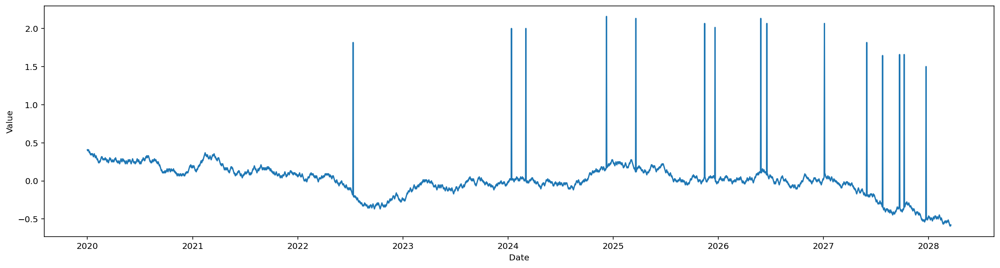

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.83E-01, min: 1.38E+01
INFO:NP.utils_torch:lr-range-test results: steep: 2.83E-01, min: 1.38E+01
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 3.78E+00
INFO:NP.utils_torch:learning rate range test selected lr: 3.78E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 7.555024516993905
INFO:NP.config:train_speed-1 increased learning_rate to 7.555024516993905
Epoch[68/68]: 100%|██████████| 68/68 [00:05<00:00, 12.04it/s, SmoothL1Loss=2.79e-6, MAE=0.00166, MSE=4.21e-6, RegLoss=0]  


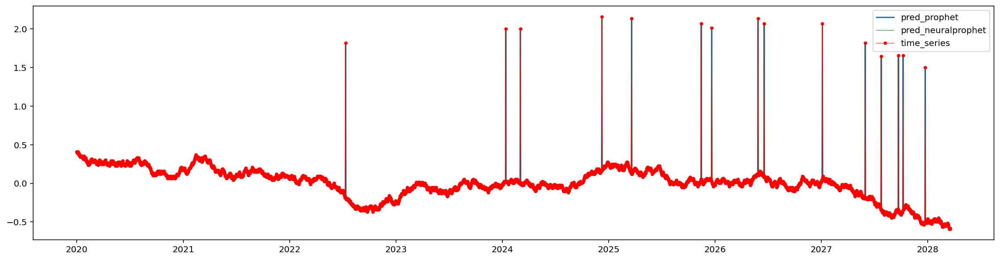

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



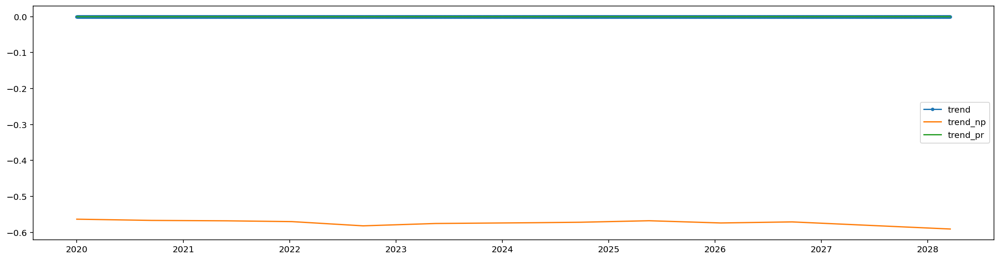

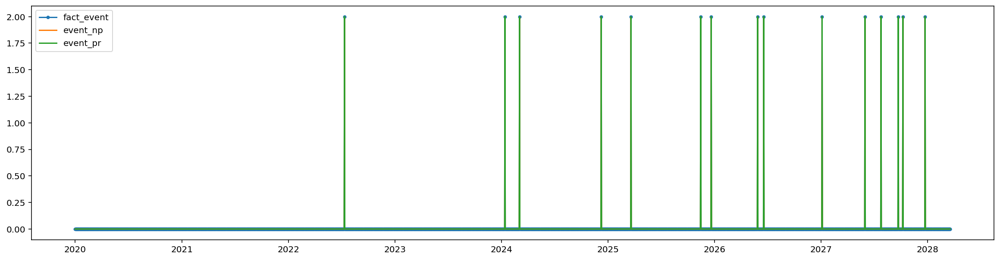

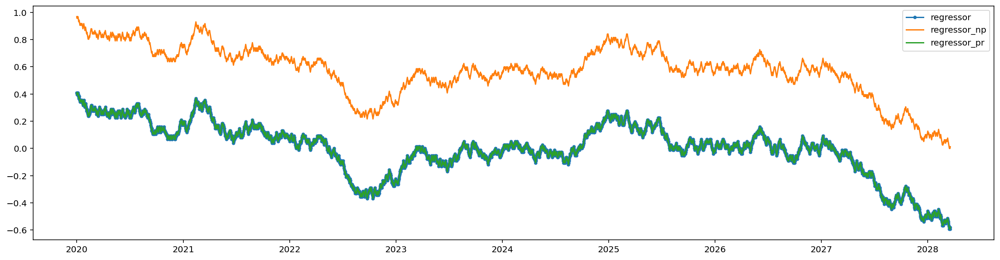

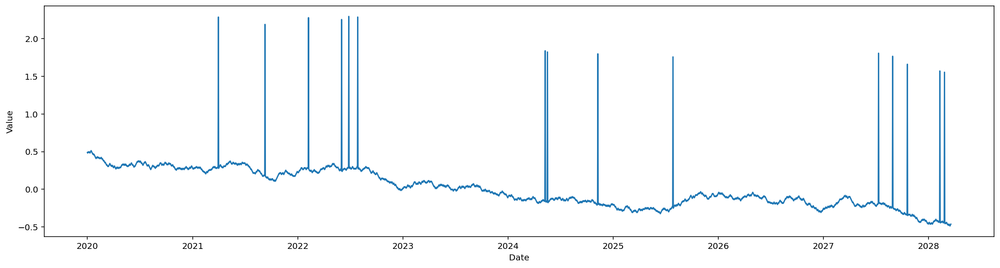

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 5.72E-02, min: 2.58E+00
INFO:NP.utils_torch:lr-range-test results: steep: 5.72E-02, min: 2.58E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 7.25E-01
INFO:NP.utils_torch:learning rate range test selected lr: 7.25E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.449853473330068
INFO:NP.config:train_speed-1 increased learning_rate to 1.449853473330068
Epoch[68/68]: 100%|██████████| 68/68 [00:05<00:00, 11.97it/s, SmoothL1Loss=2.15e-7, MAE=0.000429, MSE=2.96e-7, RegLoss=0]


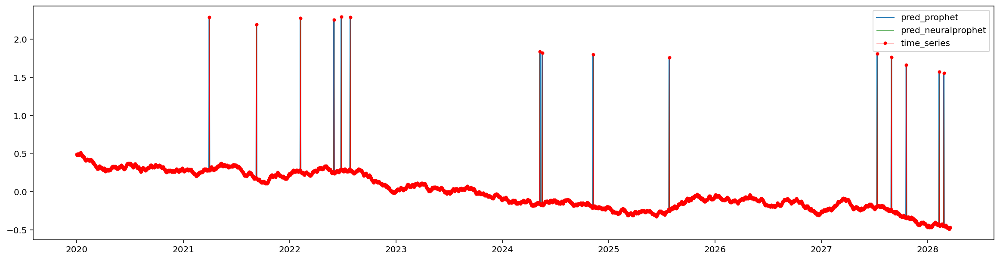

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



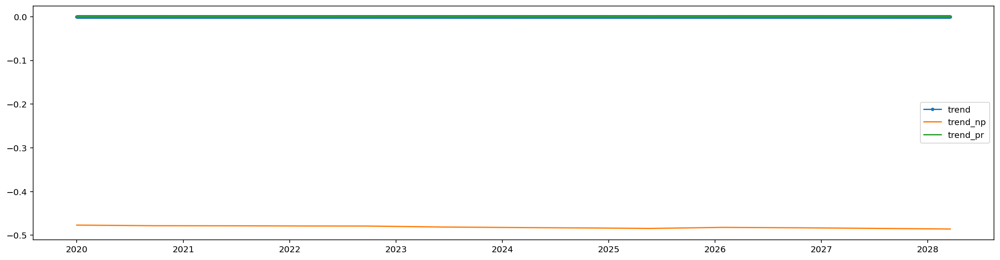

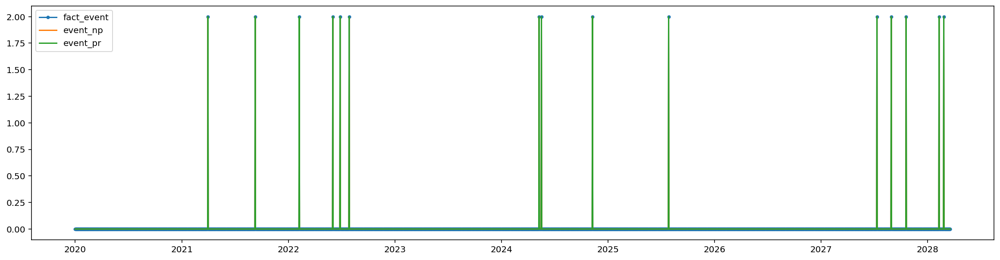

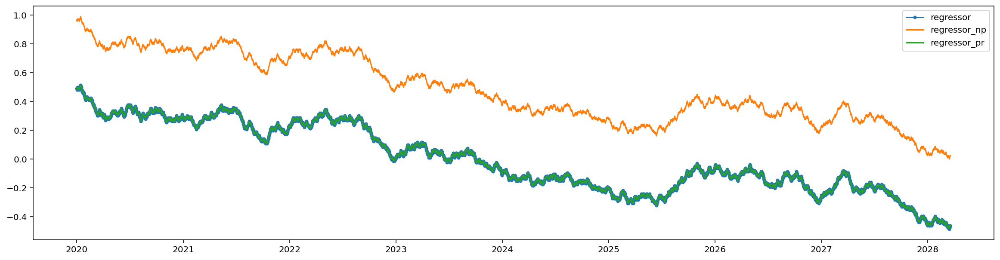

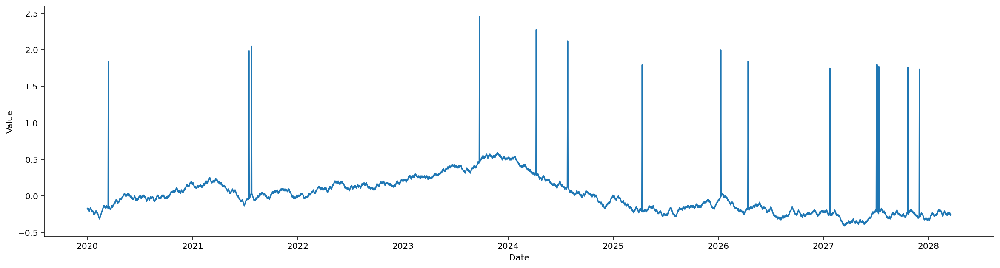

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.94E-01, min: 1.10E+01
INFO:NP.utils_torch:lr-range-test results: steep: 1.94E-01, min: 1.10E+01
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 2.86E+00
INFO:NP.utils_torch:learning rate range test selected lr: 2.86E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 5.713633097513991
INFO:NP.config:train_speed-1 increased learning_rate to 5.713633097513991
Epoch[68/68]: 100%|██████████| 68/68 [00:05<00:00, 12.21it/s, SmoothL1Loss=1.04e-6, MAE=0.000994, MSE=1.56e-6, RegLoss=0]


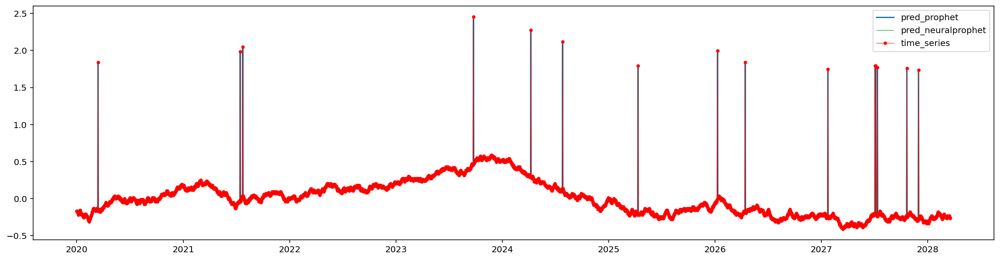

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



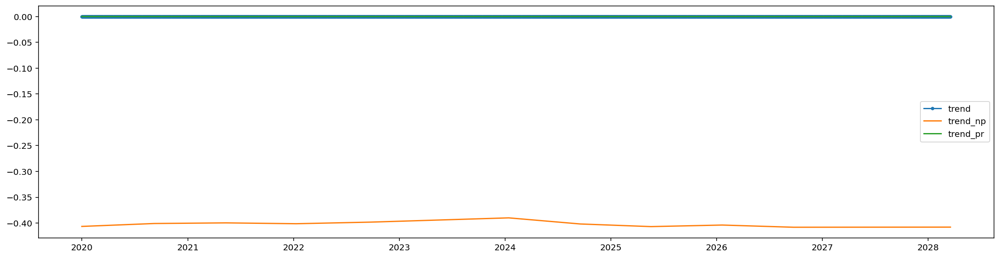

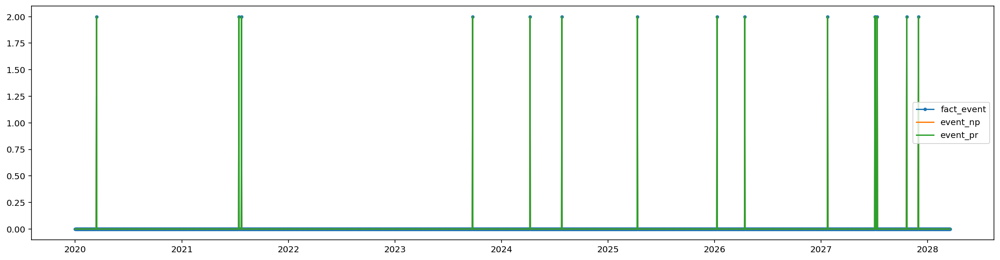

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



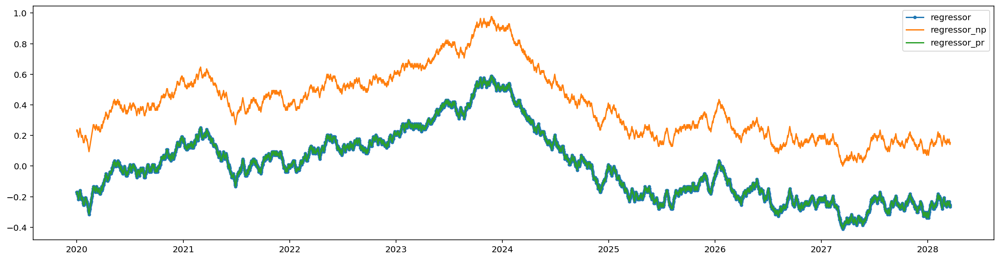

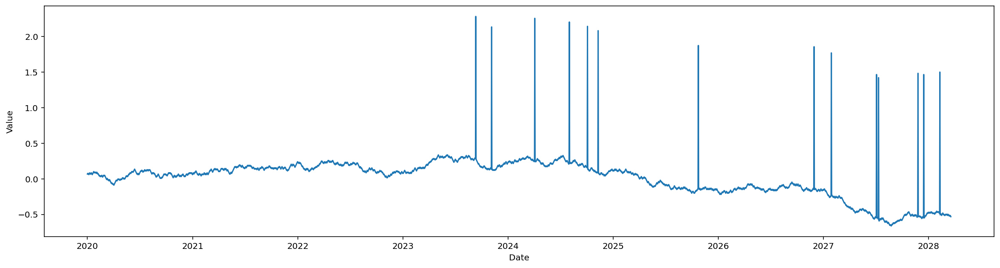

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.79E-01, min: 1.02E+01
INFO:NP.utils_torch:lr-range-test results: steep: 1.79E-01, min: 1.02E+01
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 2.65E+00
INFO:NP.utils_torch:learning rate range test selected lr: 2.65E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 5.294489767707027
INFO:NP.config:train_speed-1 increased learning_rate to 5.294489767707027
Epoch[68/68]: 100%|██████████| 68/68 [00:05<00:00, 12.19it/s, SmoothL1Loss=2.76e-6, MAE=0.00177, MSE=4.96e-6, RegLoss=0]  


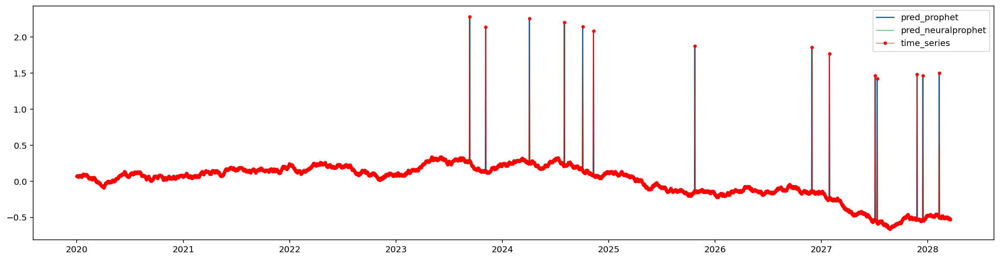

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



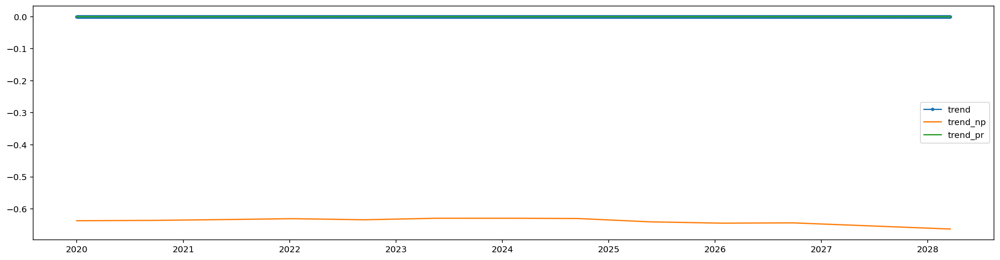

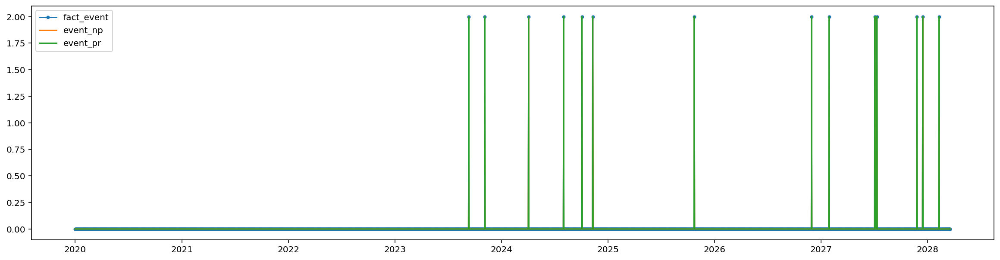

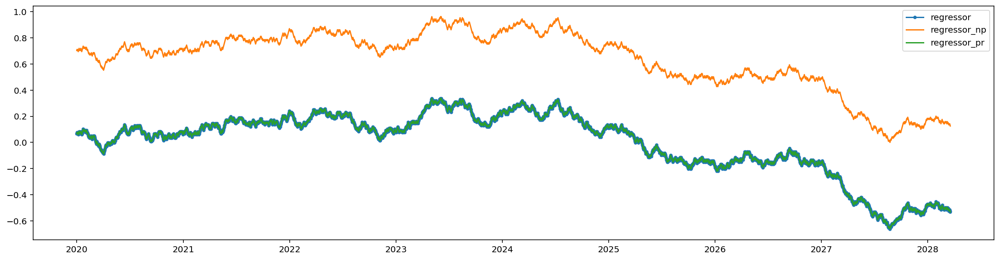

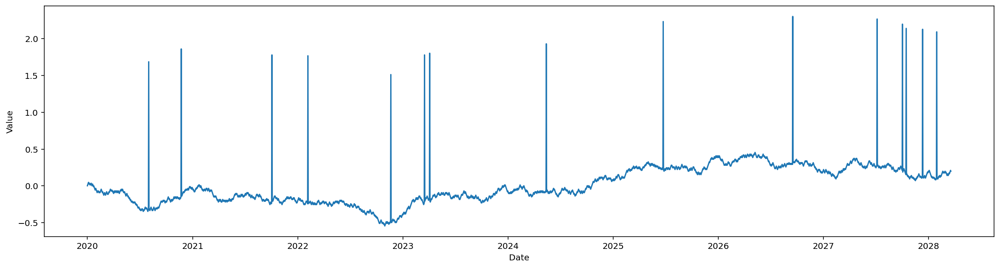

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 3.11E-02, min: 5.97E+00
INFO:NP.utils_torch:lr-range-test results: steep: 3.11E-02, min: 5.97E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 1.03E+00
INFO:NP.utils_torch:learning rate range test selected lr: 1.03E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 2.0688827474684754
INFO:NP.config:train_speed-1 increased learning_rate to 2.0688827474684754
Epoch[68/68]: 100%|██████████| 68/68 [00:05<00:00, 12.21it/s, SmoothL1Loss=3.82e-7, MAE=0.000642, MSE=6.29e-7, RegLoss=0]


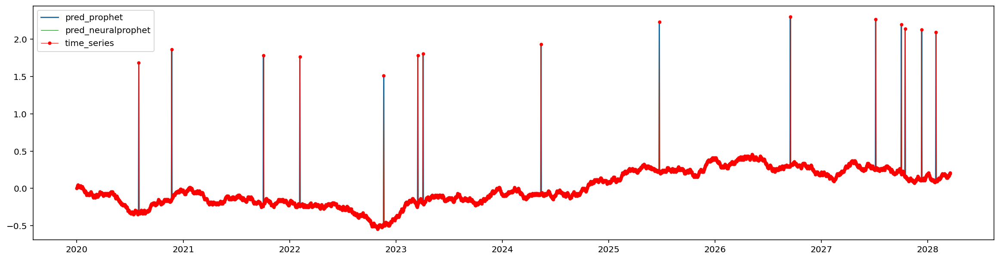

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



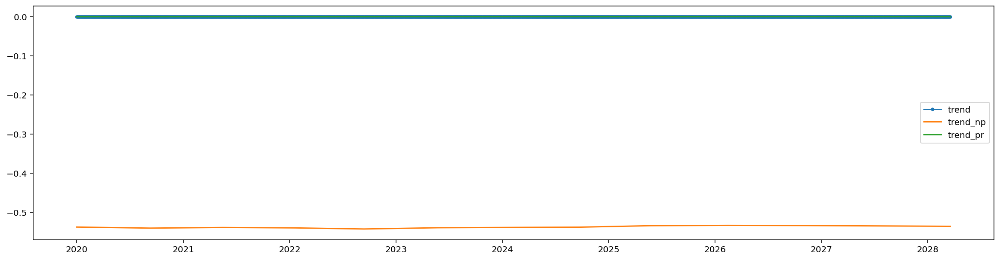

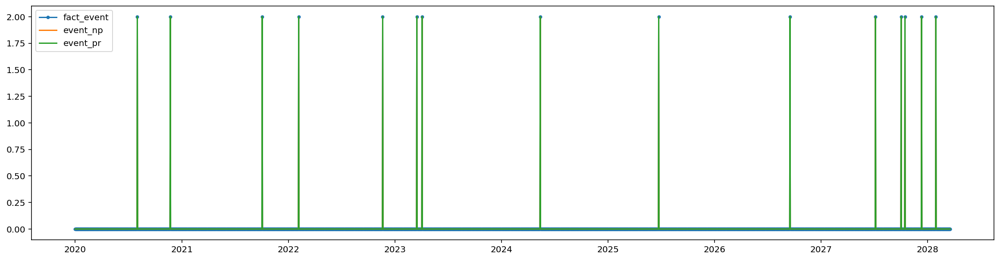

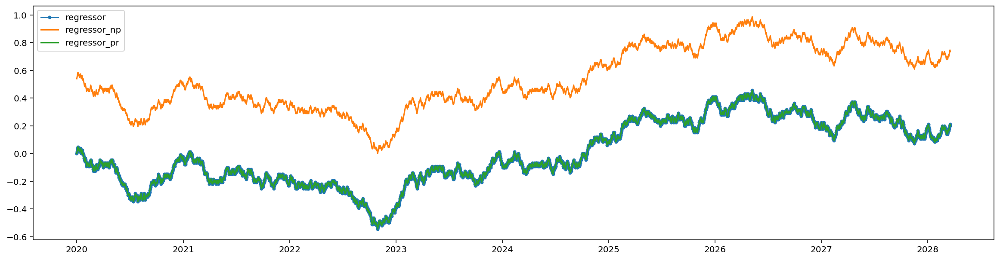

In [38]:
exp_metrics_df = []


configuration_name = 'S1.2'


number_of_periods = 100
freq = '1D'
valid_p = 0.1

seasonality_mode = 'additive'
seasonal_component = False
seasonality = 30
coeff_seasonality = 0.5
yearly_seasonality = False
yearly_seasonality_coeff = 0.4
series_order = 5

noise_std = 0
constant = 0
coeff_trend = 0

regressor = True
regressor_mode = 'additive'
rw_step = 0.5

events = True
events_mode = 'additive'
n_hist_events = 10
n_future_events = 5
event_size = 2
n_lags = 0
n_forecasts = 1


do_experiment(configuration_name,
              number_of_periods=number_of_periods,
              freq=freq,
              valid_p=valid_p,

              seasonality_mode=seasonality_mode,
              seasonal_component=seasonal_component,
              seasonality=seasonality,
              coeff_seasonality=coeff_seasonality,
              yearly_seasonality=yearly_seasonality,
              yearly_seasonality_coeff=yearly_seasonality_coeff,
              series_order=series_order,

              noise_std=noise_std,
              constant=constant,
              coeff_trend=coeff_trend,

              regressor=regressor,
              regressor_mode=regressor_mode,
              rw_step=rw_step,

              events=events,
              events_mode=events_mode,
              n_hist_events=n_hist_events,
              n_future_events=n_future_events,
              event_size=event_size,
              n_lags=n_lags,
              n_forecasts=n_forecasts)

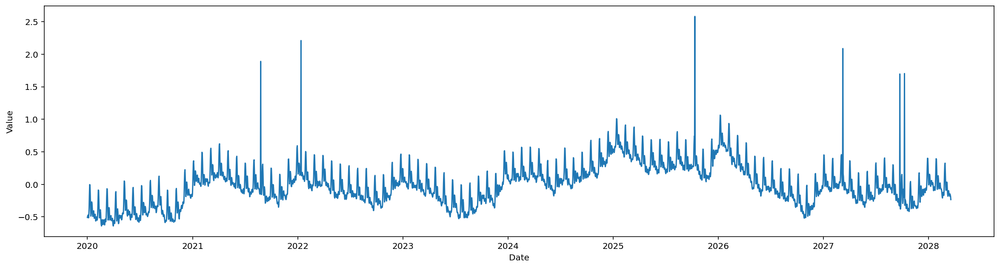

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.55E-02, min: 1.90E+00
INFO:NP.utils_torch:lr-range-test results: steep: 4.55E-02, min: 1.90E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 5.48E-01
INFO:NP.utils_torch:learning rate range test selected lr: 5.48E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.096479670334733
INFO:NP.config:train_speed-1 increased learning_rate to 1.096479670334733
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s, SmoothL1Loss=4.35e-6, MAE=0.00266, MSE=1.21e-5, RegLoss=0] 


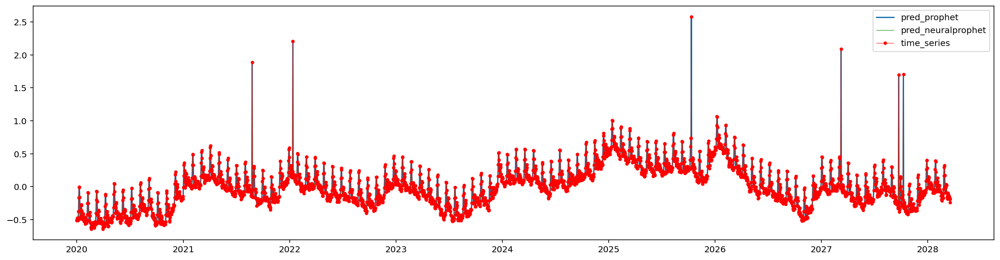

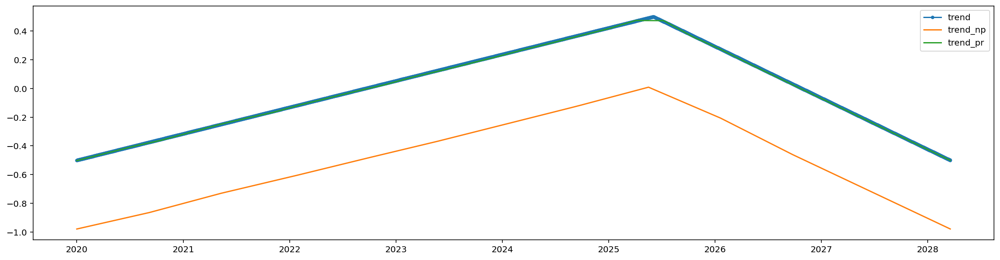

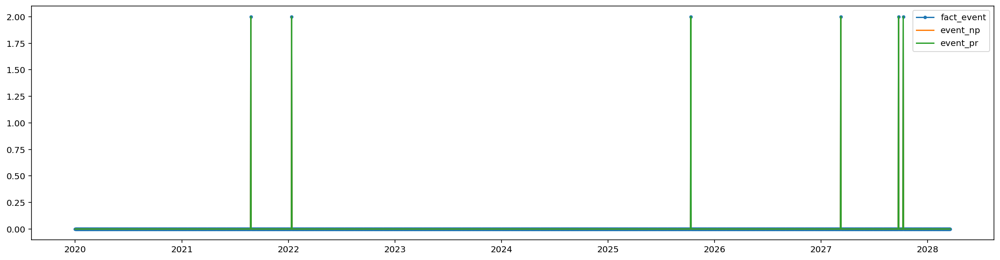

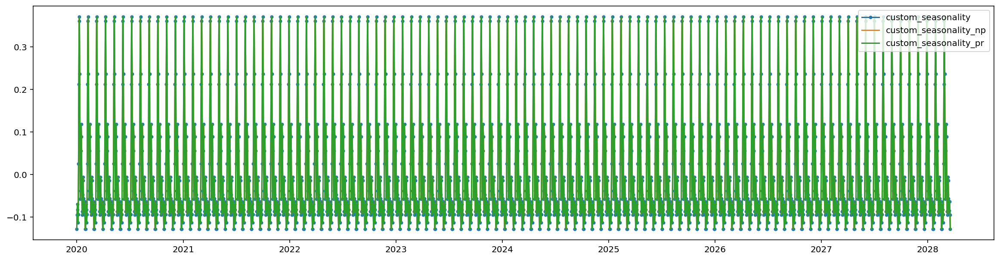

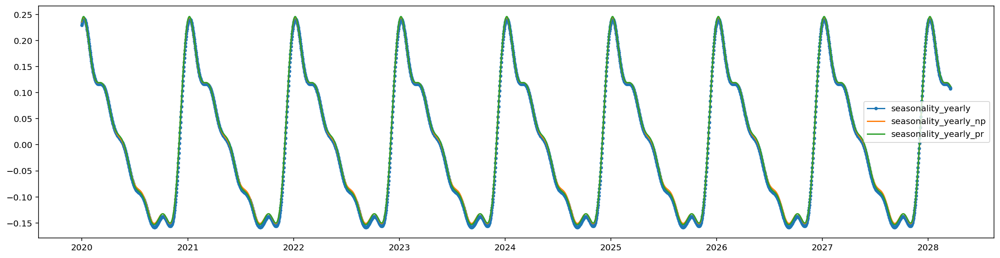

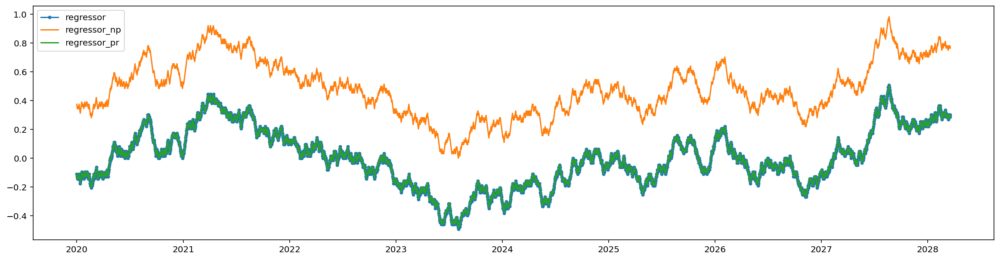

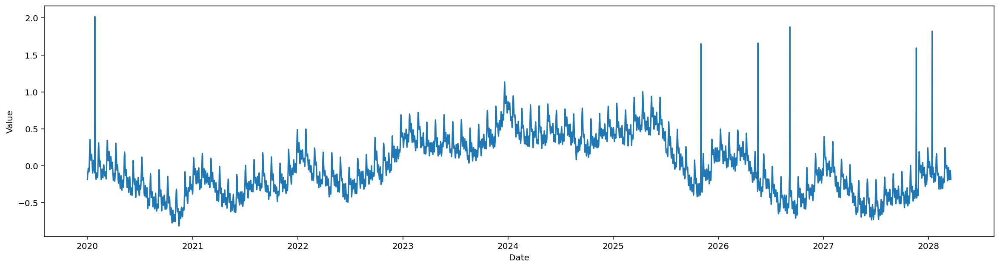

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 4.91E-02, min: 1.30E+00
INFO:NP.utils_torch:lr-range-test results: steep: 4.91E-02, min: 1.30E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 4.36E-01
INFO:NP.utils_torch:learning rate range test selected lr: 4.36E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.8724406206111732
INFO:NP.config:train_speed-1 increased learning_rate to 0.8724406206111732
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  9.19it/s, SmoothL1Loss=2.83e-6, MAE=0.00243, MSE=1.17e-5, RegLoss=0] 


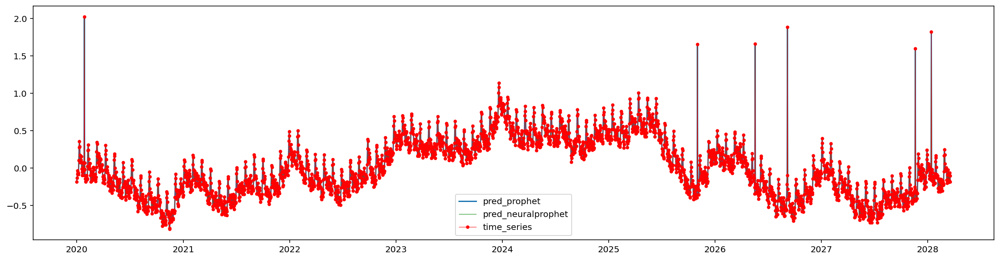

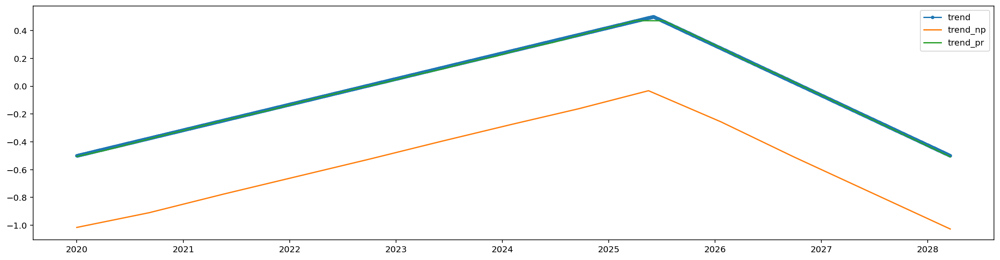

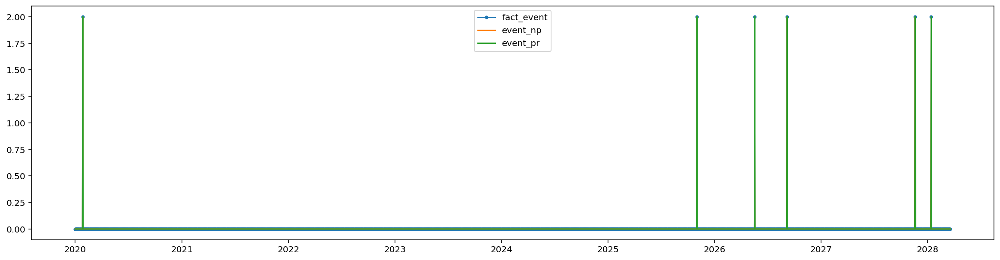

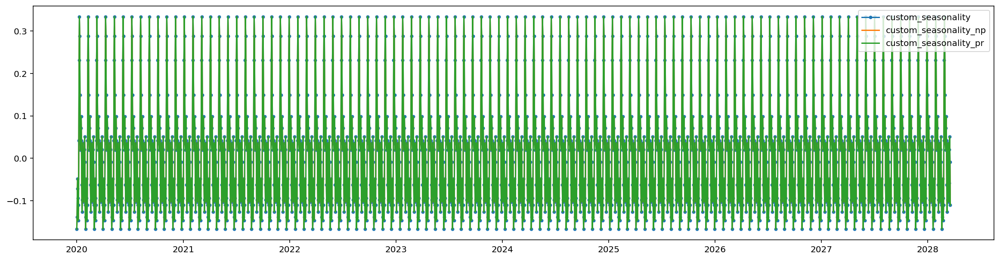

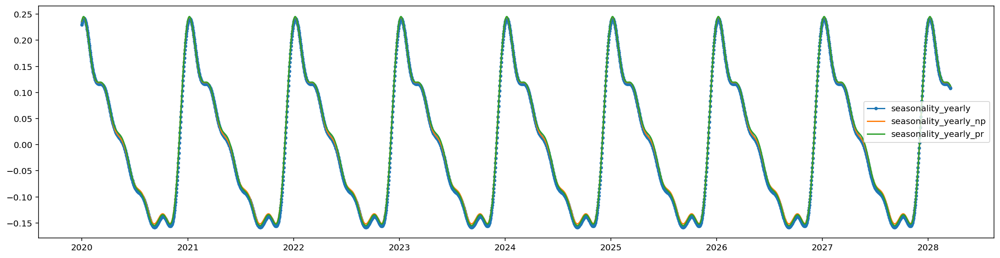

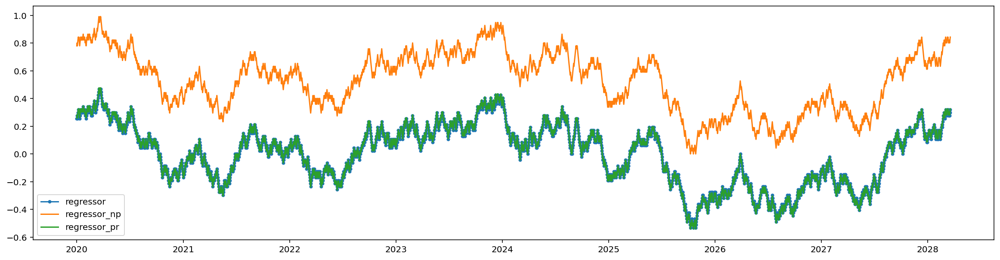

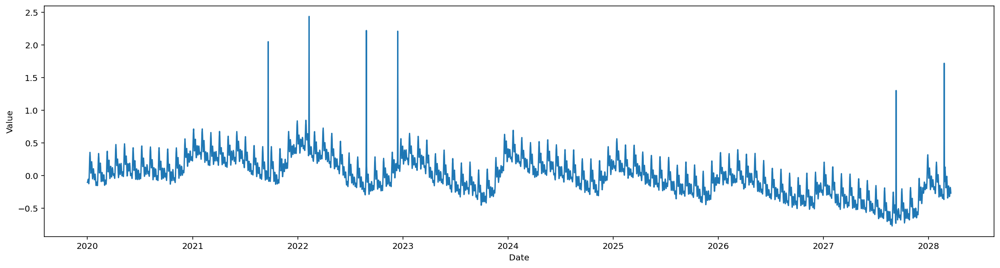

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.12E-02, min: 1.63E+00
INFO:NP.utils_torch:lr-range-test results: steep: 2.12E-02, min: 1.63E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 3.84E-01
INFO:NP.utils_torch:learning rate range test selected lr: 3.84E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.768402588506214
INFO:NP.config:train_speed-1 increased learning_rate to 0.768402588506214
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  9.18it/s, SmoothL1Loss=4.04e-5, MAE=0.00768, MSE=0.00012, RegLoss=0] 


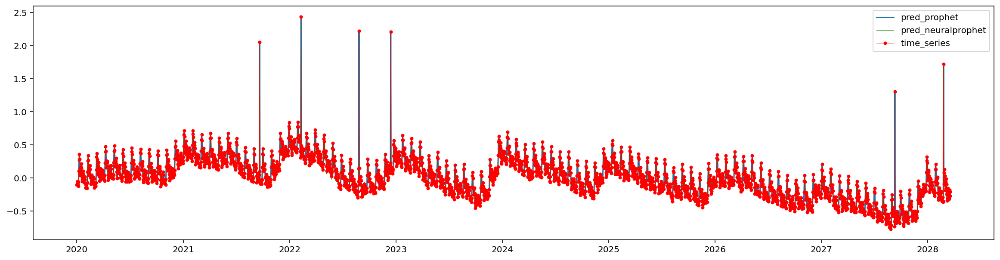

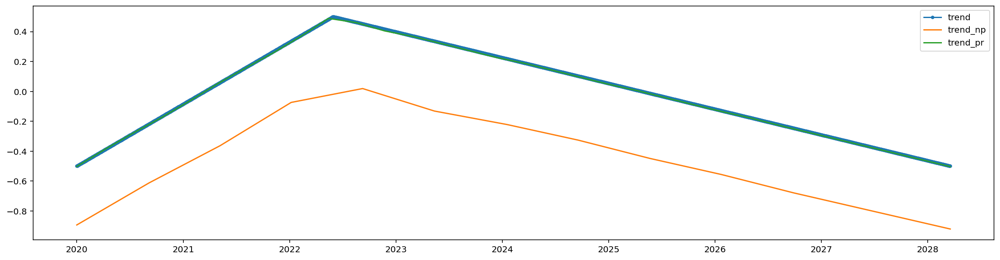

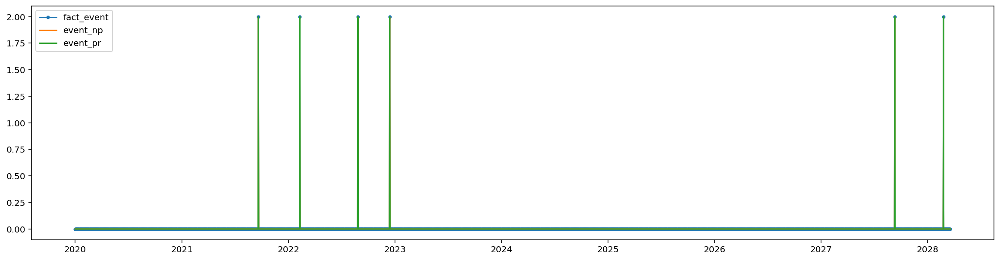

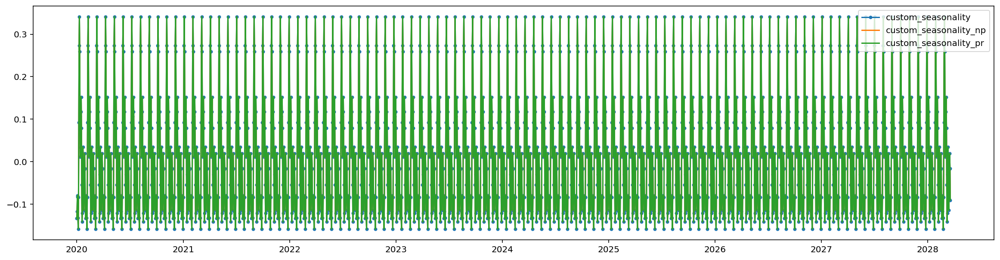

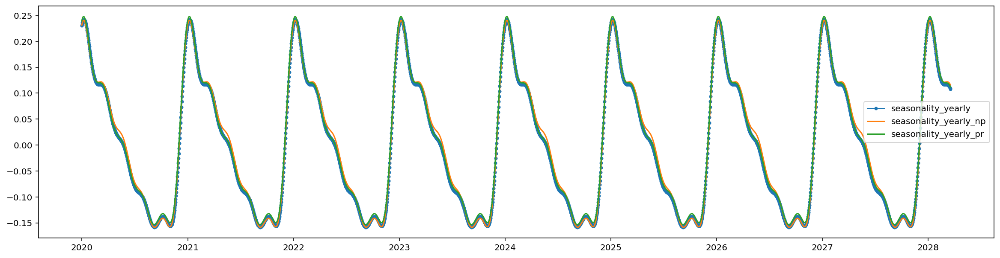

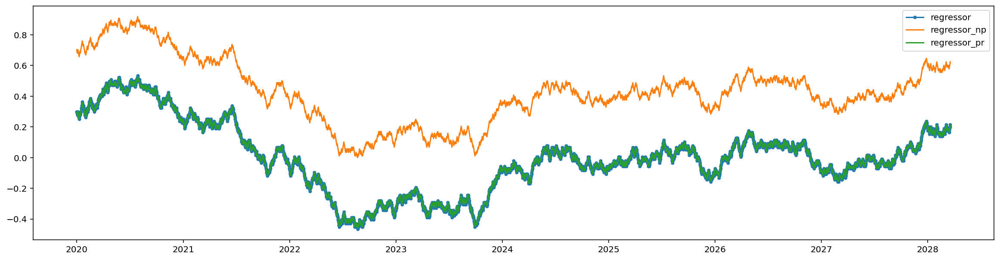

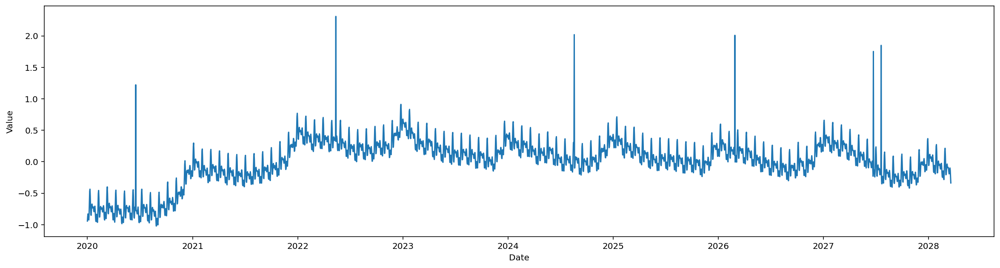

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.32E-01, min: 1.40E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.32E-01, min: 1.40E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 6.38E-01
INFO:NP.utils_torch:learning rate range test selected lr: 6.38E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.276959297334305
INFO:NP.config:train_speed-1 increased learning_rate to 1.276959297334305
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  9.13it/s, SmoothL1Loss=2.86e-5, MAE=0.00745, MSE=0.000125, RegLoss=0]


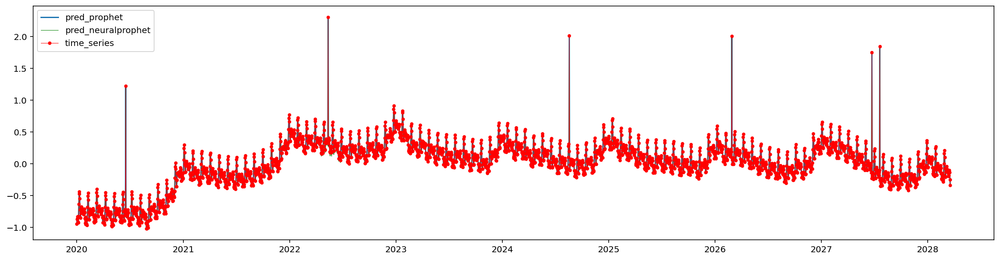

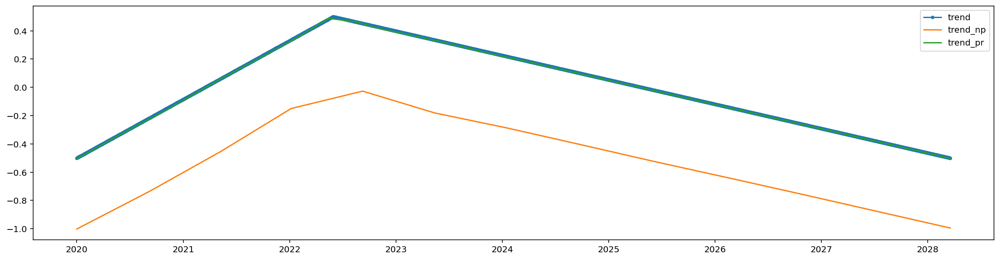

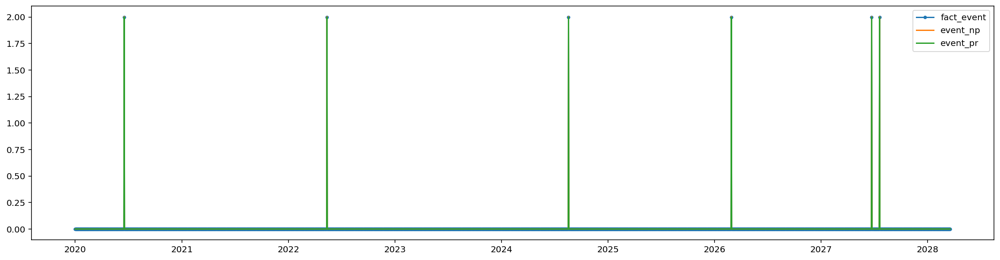

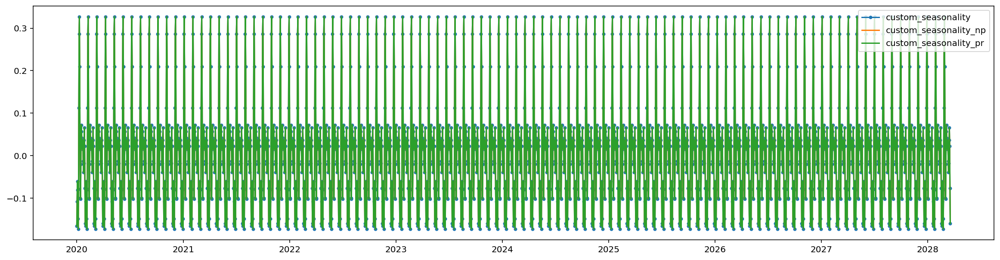

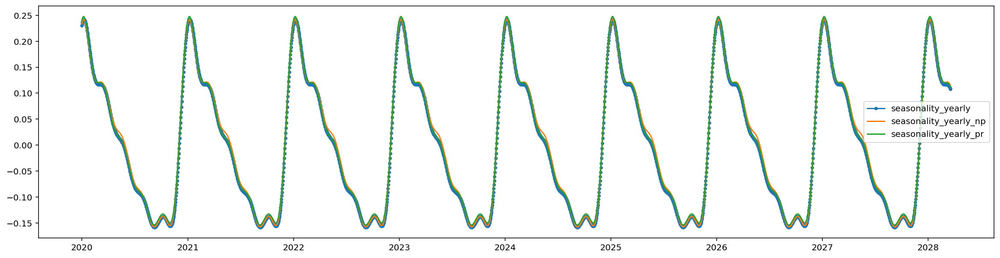

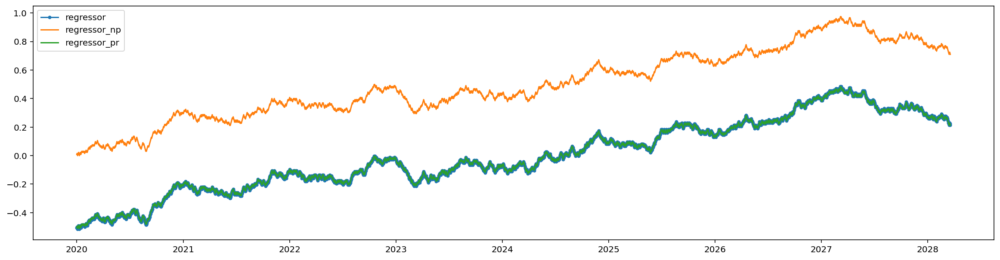

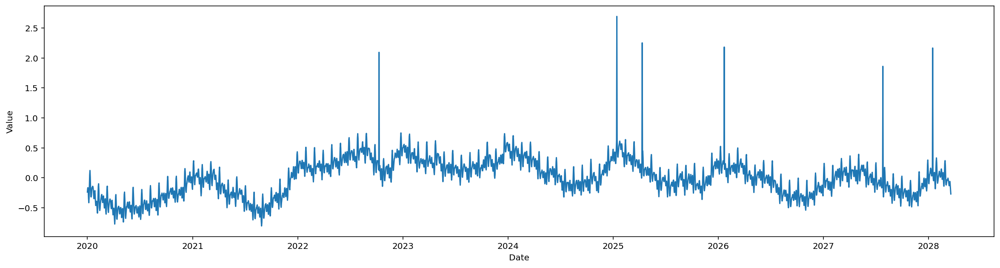

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.67E-02, min: 1.63E+00
INFO:NP.utils_torch:lr-range-test results: steep: 2.67E-02, min: 1.63E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 4.15E-01
INFO:NP.utils_torch:learning rate range test selected lr: 4.15E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.8292339119593639
INFO:NP.config:train_speed-1 increased learning_rate to 0.8292339119593639
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  9.08it/s, SmoothL1Loss=1.45e-5, MAE=0.00455, MSE=4.63e-5, RegLoss=0] 


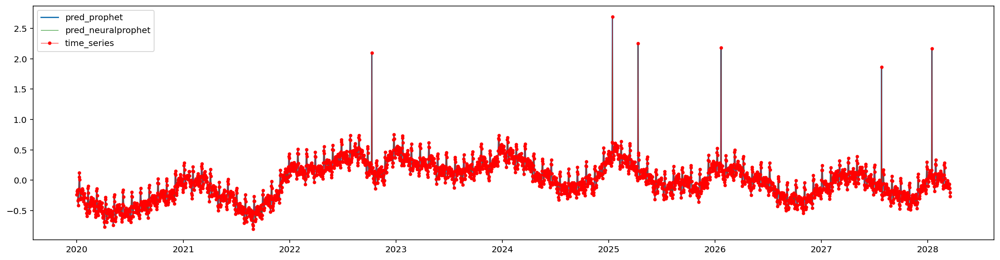

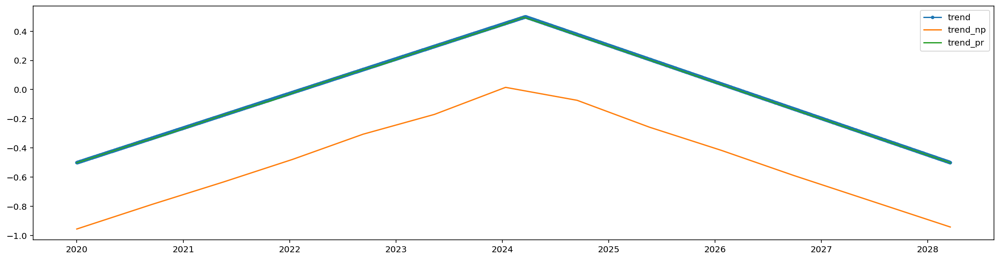

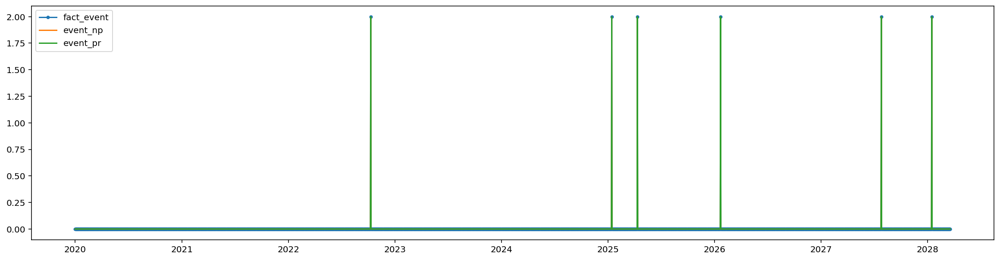

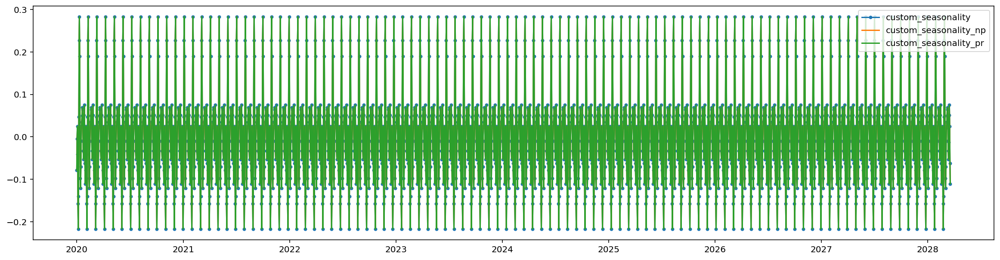

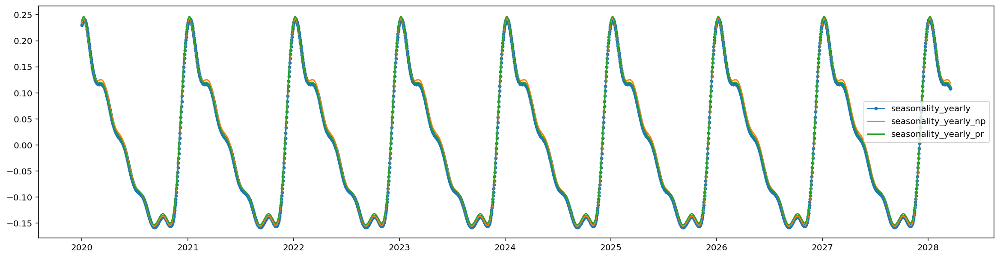

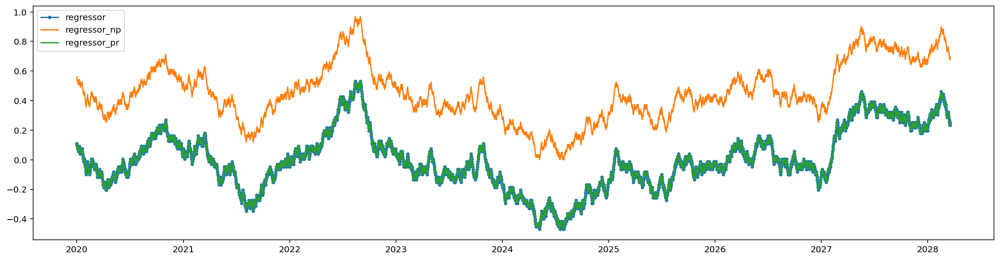

In [39]:
exp_metrics_df = []


configuration_name = 'S1.3'


number_of_periods = 100
freq = '1D'
valid_p = 0.1

seasonality_mode = 'additive'
seasonal_component = True
seasonality = 30
coeff_seasonality = 0.5
yearly_seasonality = True
yearly_seasonality_coeff = 0.4
series_order = 5

noise_std = 0
constant = 0
coeff_trend = 2

regressor = True
regressor_mode = 'additive'
rw_step = 0.5

events = True
events_mode = 'additive'
n_hist_events = 10
n_future_events = 5
event_size = 2
n_lags = 0
n_forecasts = 1


do_experiment(configuration_name,
              number_of_periods=number_of_periods,
              freq=freq,
              valid_p=valid_p,

              seasonality_mode=seasonality_mode,
              seasonal_component=seasonal_component,
              seasonality=seasonality,
              coeff_seasonality=coeff_seasonality,
              yearly_seasonality=yearly_seasonality,
              yearly_seasonality_coeff=yearly_seasonality_coeff,
              series_order=series_order,

              noise_std=noise_std,
              constant=constant,
              coeff_trend=coeff_trend,

              regressor=regressor,
              regressor_mode=regressor_mode,
              rw_step=rw_step,

              events=events,
              events_mode=events_mode,
              n_hist_events=n_hist_events,
              n_future_events=n_future_events,
              event_size=event_size,
              n_lags=n_lags,
              n_forecasts=n_forecasts)

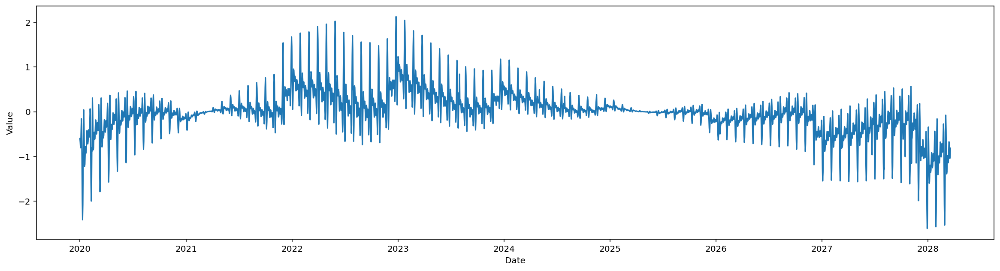

In [46]:
df, events_triplet = generate_ts(number_of_periods=100,
                                 freq='1D',
                                 valid_p=0.1,

                                 seasonality_mode='multiplicative',
                                 seasonal_component=True,
                                 seasonality=30,
                                 coeff_seasonality=5,
                                 yearly_seasonality=True,
                                 yearly_seasonality_coeff=2,
                                 series_order=5,

                                 noise_std=0,
                                 constant=0,
                                 coeff_trend=2,

                                 regressor=True,
                                 regressor_mode='multiplicative',
                                 rw_step=2,

                                 events=True,
                                 events_mode='multiplicative',
                                 n_hist_events=10,
                                 n_future_events=5,
                                 event_size=2
                                 )

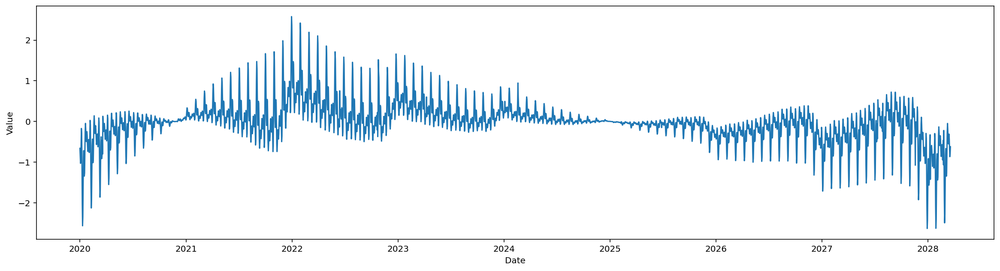

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.45E-02, min: 3.36E-02
INFO:NP.utils_torch:lr-range-test results: steep: 1.45E-02, min: 3.36E-02
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 2.54E-02
INFO:NP.utils_torch:learning rate range test selected lr: 2.54E-02
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 0.050750667695512446
INFO:NP.config:train_speed-1 increased learning_rate to 0.050750667695512446
Epoch[68/68]: 100%|██████████| 68/68 [00:08<00:00,  8.42it/s, SmoothL1Loss=0.00679, MAE=0.26, MSE=0.153, RegLoss=0] 


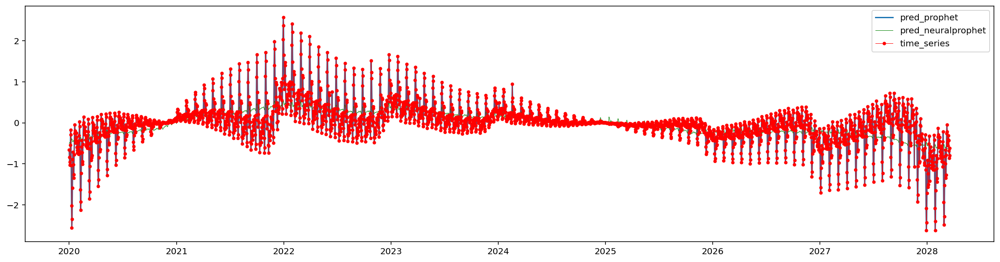

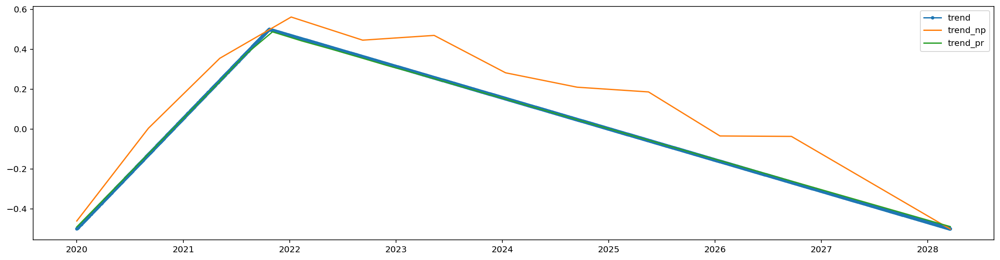

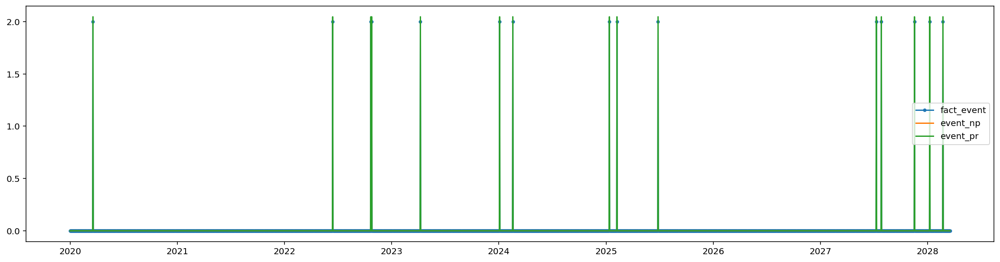

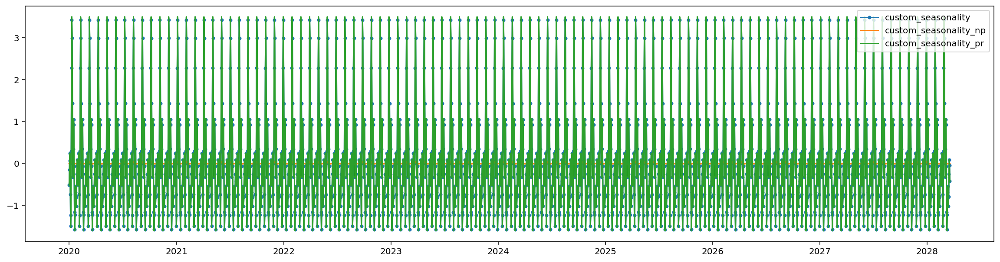

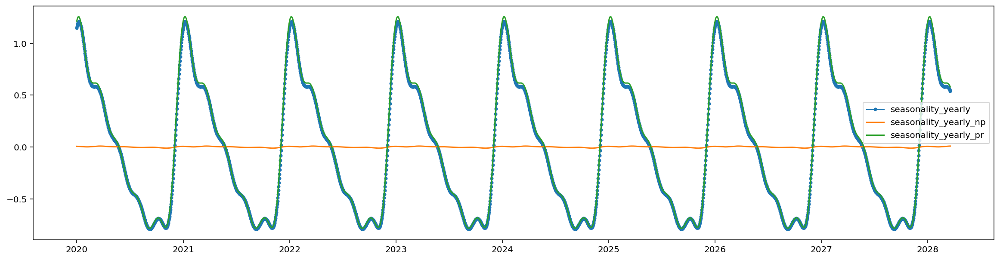

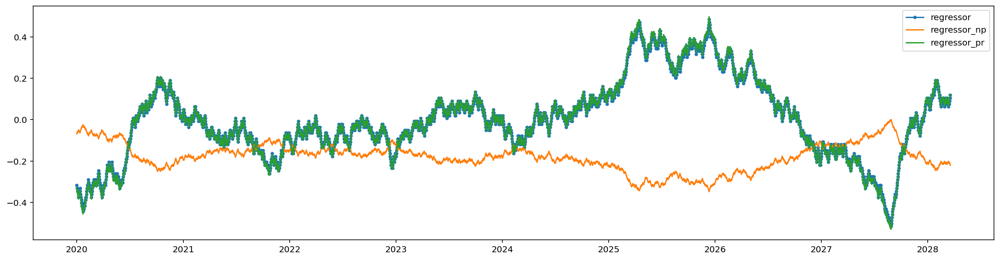

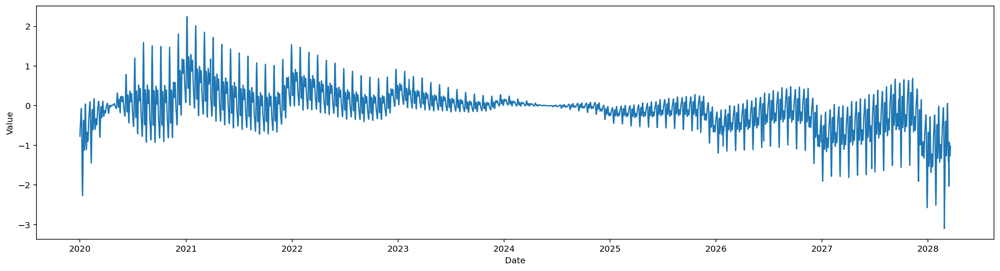

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 2.67E-02, min: 2.22E+00
INFO:NP.utils_torch:lr-range-test results: steep: 2.67E-02, min: 2.22E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 5.08E-01
INFO:NP.utils_torch:learning rate range test selected lr: 5.08E-01
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 1.0160436093826037
INFO:NP.config:train_speed-1 increased learning_rate to 1.0160436093826037
Epoch[68/68]: 100%|██████████| 68/68 [00:07<00:00,  8.68it/s, SmoothL1Loss=0.0094, MAE=0.396, MSE=0.271, RegLoss=0] 


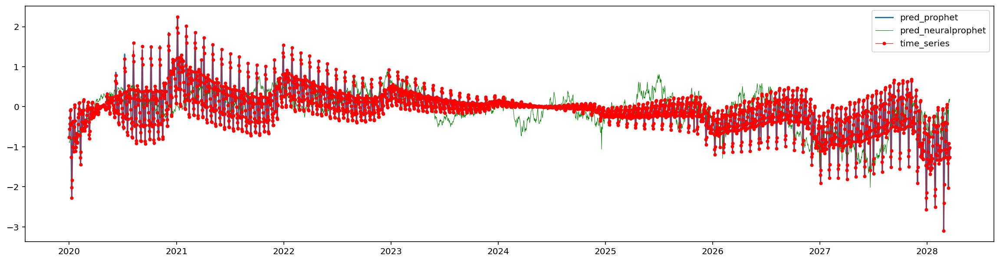

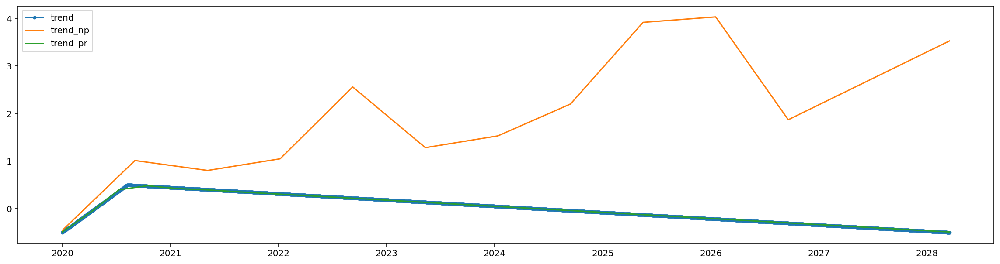

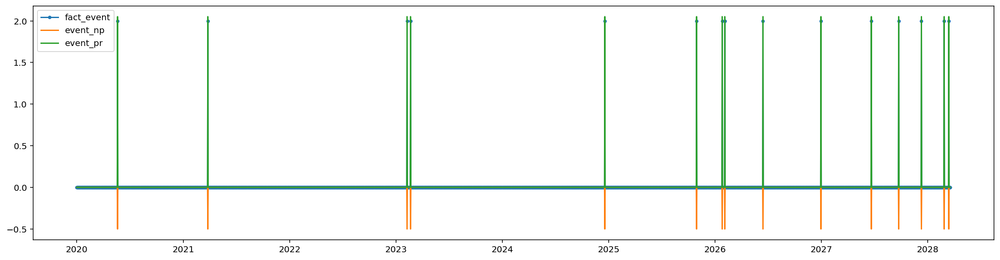

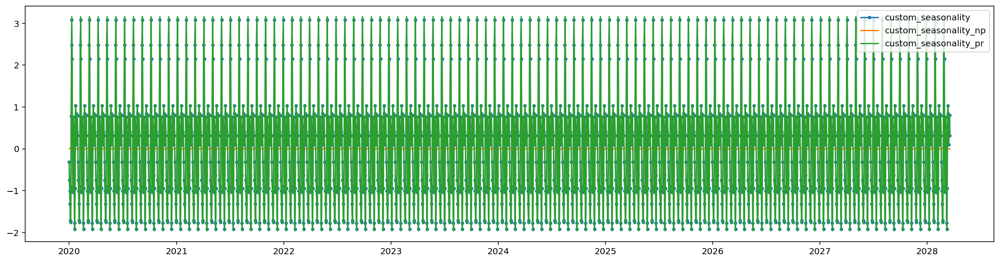

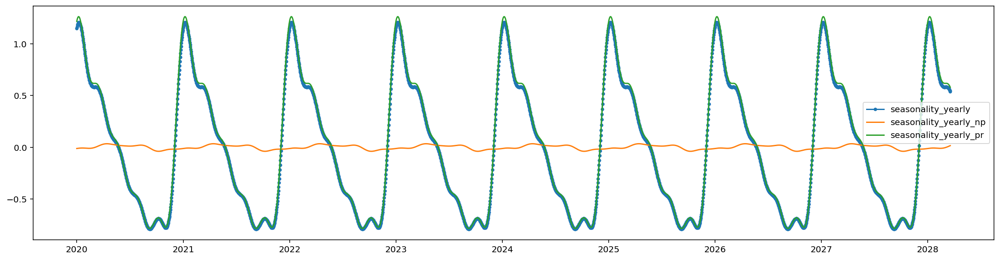

WARNING - (py.warnings._showwarnmsg) - <ipython-input-2-1906c790496d>:25: RuntimeWarning: divide by zero encountered in double_scalars
  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)

  return np.sum(np.abs(y_true-y_pred))/np.sum(y_true)



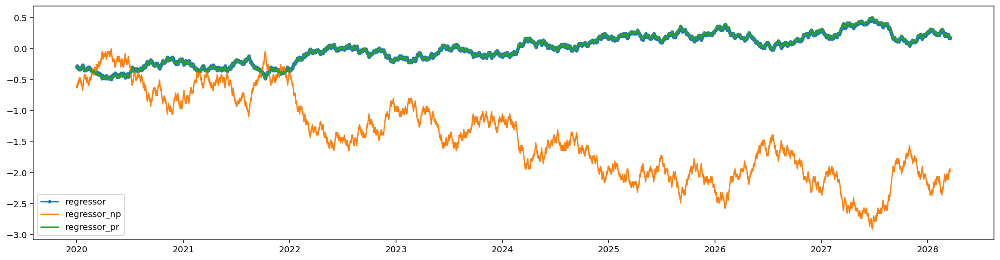

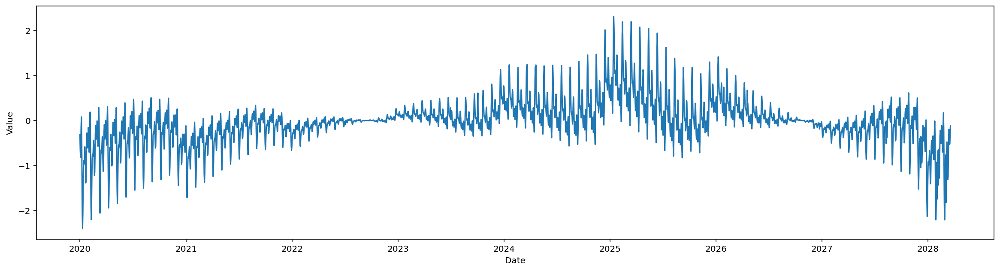

INFO - (NP.config.set_auto_batch_epoch) - Auto-set batch_size to 32
INFO:NP.config:Auto-set batch_size to 32
INFO - (NP.config.set_auto_batch_epoch) - Auto-set epochs to 137
INFO:NP.config:Auto-set epochs to 137
INFO - (NP.config.apply_train_speed) - train_speed-1 increased batch_size to 64
INFO:NP.config:train_speed-1 increased batch_size to 64
INFO - (NP.config.apply_train_speed) - train_speed-1 decreased epochs to 68
INFO:NP.config:train_speed-1 decreased epochs to 68


  0%|          | 0/273 [00:00<?, ?it/s]

INFO - (NP.utils_torch.lr_range_test) - lr-range-test results: steep: 1.94E-01, min: 3.50E+00
INFO:NP.utils_torch:lr-range-test results: steep: 1.94E-01, min: 3.50E+00
INFO - (NP.utils_torch.lr_range_test) - learning rate range test selected lr: 1.33E+00
INFO:NP.utils_torch:learning rate range test selected lr: 1.33E+00
INFO - (NP.config.apply_train_speed) - train_speed-1 increased learning_rate to 2.667042864326648
INFO:NP.config:train_speed-1 increased learning_rate to 2.667042864326648
Epoch[68/68]: 100%|██████████| 68/68 [00:08<00:00,  8.33it/s, SmoothL1Loss=0.00766, MAE=0.287, MSE=0.157, RegLoss=0]


SystemError: <class 'stanfit4anon_model_dfdaf2b8ece8a02eb11f050ec701c0ec_6632217358614822892.PyStanHolder'> returned a result with an error set

In [47]:
exp_metrics_df = []


configuration_name = 'S1.4'


number_of_periods = 100
freq = '1D'
valid_p = 0.1

seasonality_mode = 'multiplicative'
seasonal_component = True
seasonality = 30
coeff_seasonality = 5
yearly_seasonality = True
yearly_seasonality_coeff = 2
series_order = 5

noise_std = 0
constant = 0
coeff_trend = 2

regressor = True
regressor_mode = 'multiplicative'
rw_step = 2

events = True
events_mode = 'multiplicative'
n_hist_events = 10
n_future_events = 5
event_size = 2
n_lags = 0
n_forecasts = 1


do_experiment(configuration_name,
              number_of_periods=number_of_periods,
              freq=freq,
              valid_p=valid_p,

              seasonality_mode=seasonality_mode,
              seasonal_component=seasonal_component,
              seasonality=seasonality,
              coeff_seasonality=coeff_seasonality,
              yearly_seasonality=yearly_seasonality,
              yearly_seasonality_coeff=yearly_seasonality_coeff,
              series_order=series_order,

              noise_std=noise_std,
              constant=constant,
              coeff_trend=coeff_trend,

              regressor=regressor,
              regressor_mode=regressor_mode,
              rw_step=rw_step,

              events=events,
              events_mode=events_mode,
              n_hist_events=n_hist_events,
              n_future_events=n_future_events,
              event_size=event_size,
              n_lags=n_lags,
              n_forecasts=n_forecasts)